In [1]:
from src.HestonModel import generate_heston_paths
import numpy as np
import esig
import matplotlib.pyplot as plt
import iisignature
import signatory
import torch
from tqdm.auto import tqdm

In [7]:
#############################################################################################

In [2]:
thetas=0.2 #Long run variance θ
kappas= 2 # Mean reversion κ
v_0s = thetas #  Initial variance
rhos = 0.6 #Correlation ρ, correlation between the log-returns and volatility of the asset
sigmas = 0.6 #Volatility of variance σ
rs = 0.04

S = 100
paths = 10000
steps = 50
T = 1

In [3]:
depth_of_sig=2  #level of truncation of signatures
width_of_sig=3  # prices + sigmas + time_array (parameters for signatures)
time_array = np.arange(steps)
prices_and_sigs_with_time_tensor = torch.zeros((paths,steps, width_of_sig ))
sig_keys = esig.sigkeys(width_of_sig, depth_of_sig)
sig_dim=signatory.signature_channels(width_of_sig,depth_of_sig)

In [4]:
theta=0.2 #Long run variance θ
kappa= 2 # Mean reversion κ
v_0 = thetas #  Initial varianc
rho = 0.6 #Correlation ρ, correlation between the log-returns and volatility of the asset
sigma= 0.6 #Volatility of variance σ
r = 0.04

In [5]:
by_parameter_3 = {
    "by_rs": np.arange(0.01,0.16,0.01),  # list to store 15 elements for var2
    "by_rhos": np.arange(0.0,1.1,0.075),  # list to store 15 elements for var3
    "by_sigmas": np.arange(0.0,1.1,0.075),  # list to store 15 elements for var4
    "by_kappas": np.arange(.5,5.0,0.3),   # list to store 15 elements for var5
    "by_thetas": np.arange(0.01,0.8,0.055)  # list to store 15 elements for var1
}

In [13]:
def signatures_calculations_3_parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths):
    count=0
    for kappa in by_parameter_3["by_kappas"]:
              for theta in by_parameter_3["by_thetas"]:
                  for sigma in by_parameter_3["by_sigmas"]:
                        # Caclulation of 10000 paths of prices and sigmas
                        prices_1, sigs_1 = generate_heston_paths(S, T, r, kappa, theta, theta, rho, sigma, steps, paths,
                                                                 return_vol=True)
                        for j in range(paths):
                            prices_and_sigs_with_time_tensor[j] = torch.tensor([prices_1[j], sigs_1[j], time_array]).T
                        #     shape of prices_and_sigs_witout_time_tensor=torch.Size([10000, 50, 3])

                        sign_ps_signatory_differentranges[count] = signatory.signature(prices_and_sigs_with_time_tensor, depth_of_sig)
                        #     shape of  sign_ps_signatory_differentranges=torch.Size([3375, 10000, 12])

                        Exp_sign_signatory_results[count] = torch.mean(sign_ps_signatory_differentranges[count], axis=0)
                        #     shape of  Exp_sign_signatory_results=torch.Size([3375, 12])

                        count = count + 1
    return sign_ps_signatory_differentranges,Exp_sign_signatory_results

In [14]:
number_of_loops=by_parameter_3["by_kappas"].shape[0]*by_parameter_3["by_thetas"].shape[0]*by_parameter_3["by_sigmas"].shape[0]
sign_ps_signatory_differentranges=torch.zeros((number_of_loops,paths,sig_dim))
Exp_sign_signatory_results=torch.zeros((number_of_loops,sig_dim))
# sign_ps_signatory_differentranges[0].shape

In [15]:
results_kappas_and_thetas_sigmas=signatures_calculations_3_parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths)
signatures_results_kappas_and_thetas_sigmas=results_kappas_and_thetas_sigmas[0]
Exp_signatures_results_kappas_and_theta_sigmas=results_kappas_and_thetas_sigmas[1]

In [16]:
signatures_results_kappas_and_thetas_sigmas.shape

torch.Size([3375, 10000, 12])

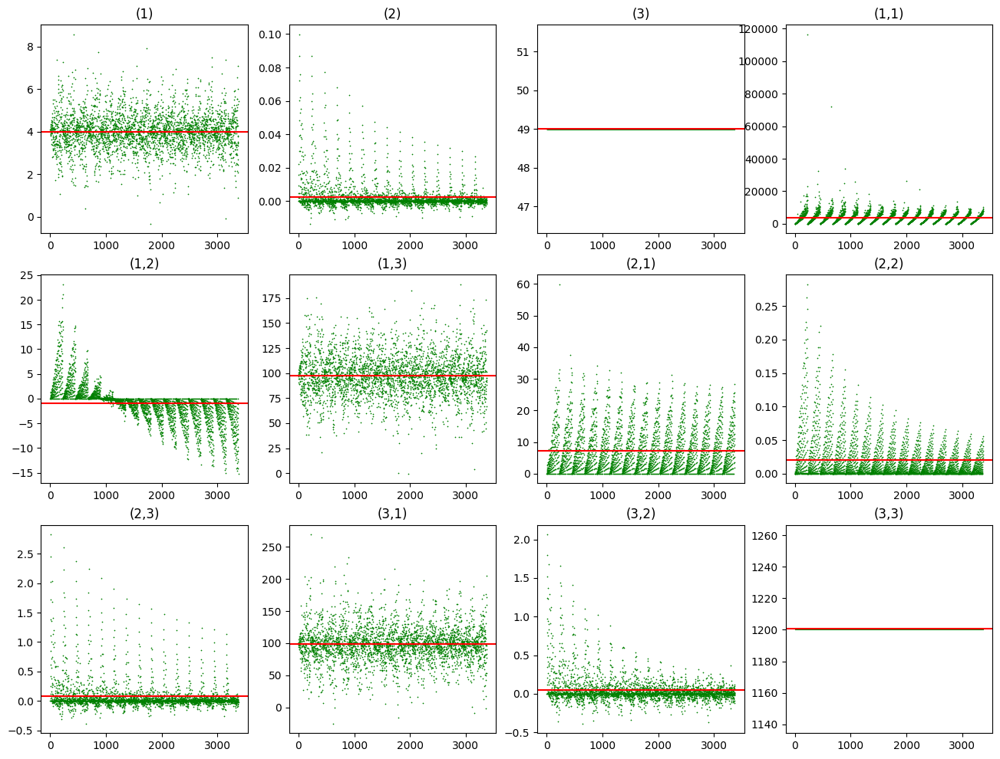

In [17]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4))
axs = axs.ravel()
for i, ax in enumerate(axs):
    ax.title.set_text(sig_keys.split()[i+1])
    ax.scatter(range(1,3376),Exp_signatures_results_kappas_and_theta_sigmas.T[i], color='green', linewidth=0.15, s=1, alpha=1)
    ax.axhline(torch.mean(Exp_signatures_results_kappas_and_theta_sigmas.T[i]), color='red')


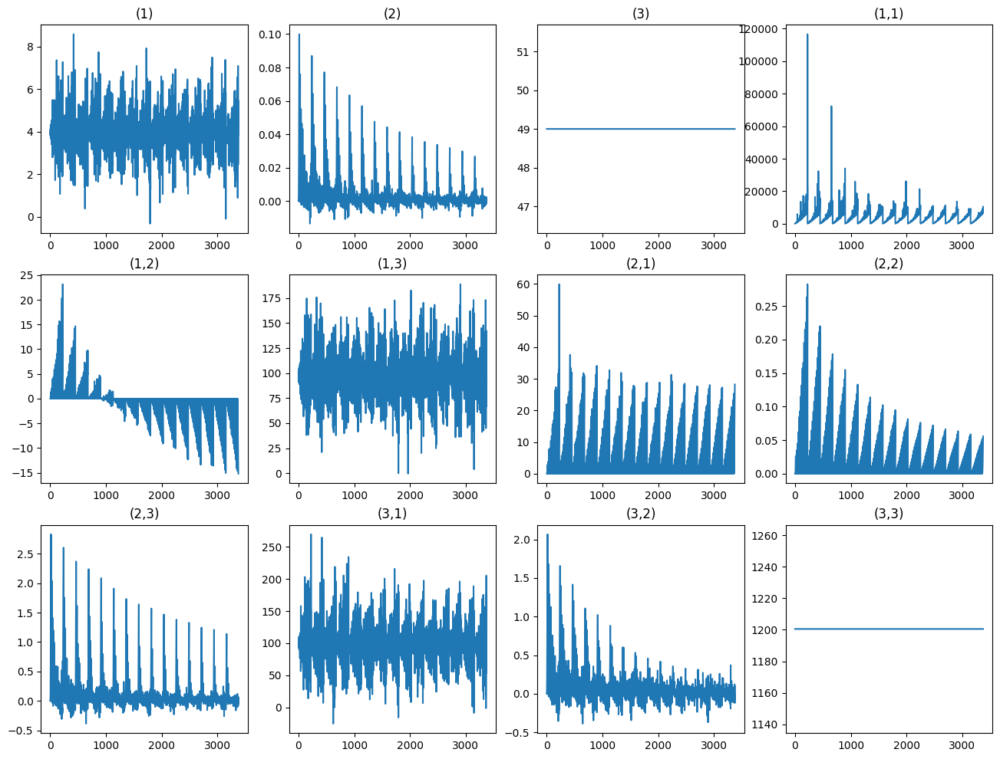

In [18]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4))
axs = axs.ravel()
for i, ax in enumerate(axs):
    ax.title.set_text(sig_keys.split()[i+1])
    ax.plot(Exp_signatures_results_kappas_and_theta_sigmas.T[i])

In [19]:
def signatures_calculations_3_parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths):
    count=0
    for theta in by_parameter_3["by_thetas"]:
              for kappa in by_parameter_3["by_kappas"]:
                  for sigma in by_parameter_3["by_sigmas"]:
                        # Caclulation of 10000 paths of prices and sigmas
                        prices_1, sigs_1 = generate_heston_paths(S, T, r, kappa, theta, theta, rho, sigma, steps, paths,
                                                                 return_vol=True)
                        for j in range(paths):
                            prices_and_sigs_with_time_tensor[j] = torch.tensor([prices_1[j], sigs_1[j], time_array]).T
                        #     shape of prices_and_sigs_witout_time_tensor=torch.Size([10000, 50, 3])

                        sign_ps_signatory_differentranges[count] = signatory.signature(prices_and_sigs_with_time_tensor, depth_of_sig)
                        #     shape of  sign_ps_signatory_differentranges=torch.Size([3375, 10000, 12])

                        Exp_sign_signatory_results[count] = torch.mean(sign_ps_signatory_differentranges[count], axis=0)
                        #     shape of  Exp_sign_signatory_results=torch.Size([3375, 12])

                        count = count + 1
    return sign_ps_signatory_differentranges,Exp_sign_signatory_results

In [20]:
results_thetas_and_kappas_sigmas=signatures_calculations_3_parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths)
signatures_results_thetas_and_kappas_sigmas=results_thetas_and_kappas_sigmas[0]
Exp_signatures_results_thetas_and_kappas_sigmas=results_thetas_and_kappas_sigmas[1]

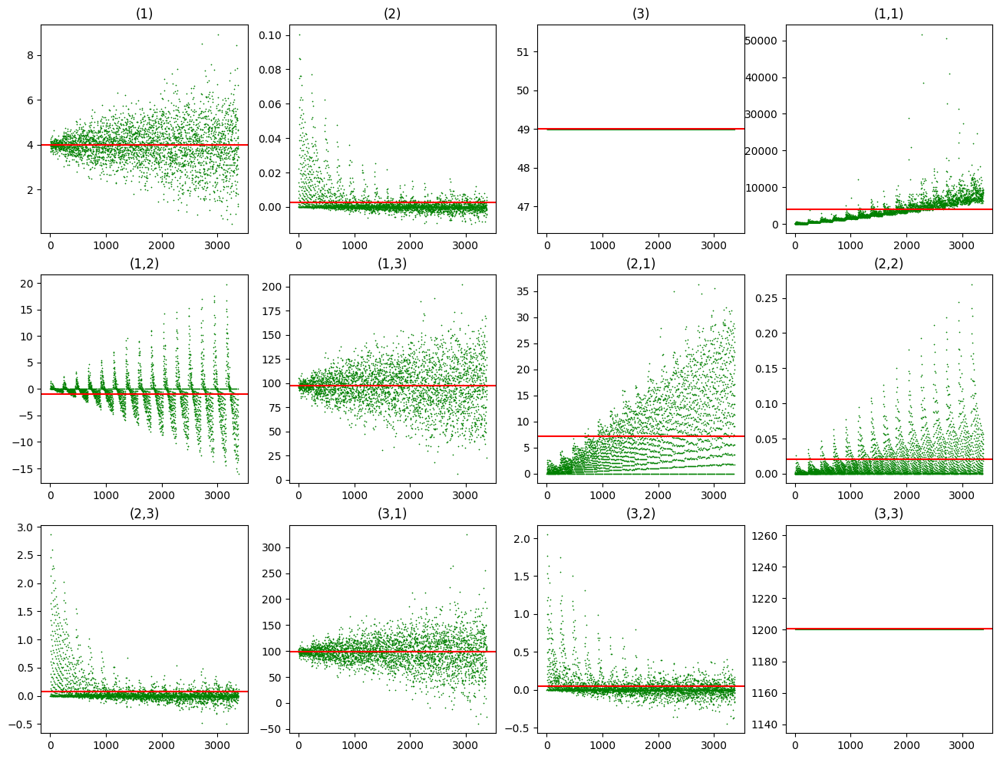

In [21]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4))
axs = axs.ravel()
for i, ax in enumerate(axs):
    ax.title.set_text(sig_keys.split()[i+1])
    ax.scatter(range(1,3376),Exp_signatures_results_thetas_and_kappas_sigmas.T[i], color='green', linewidth=0.15, s=1, alpha=1)
    ax.axhline(torch.mean(Exp_signatures_results_thetas_and_kappas_sigmas.T[i]), color='red')


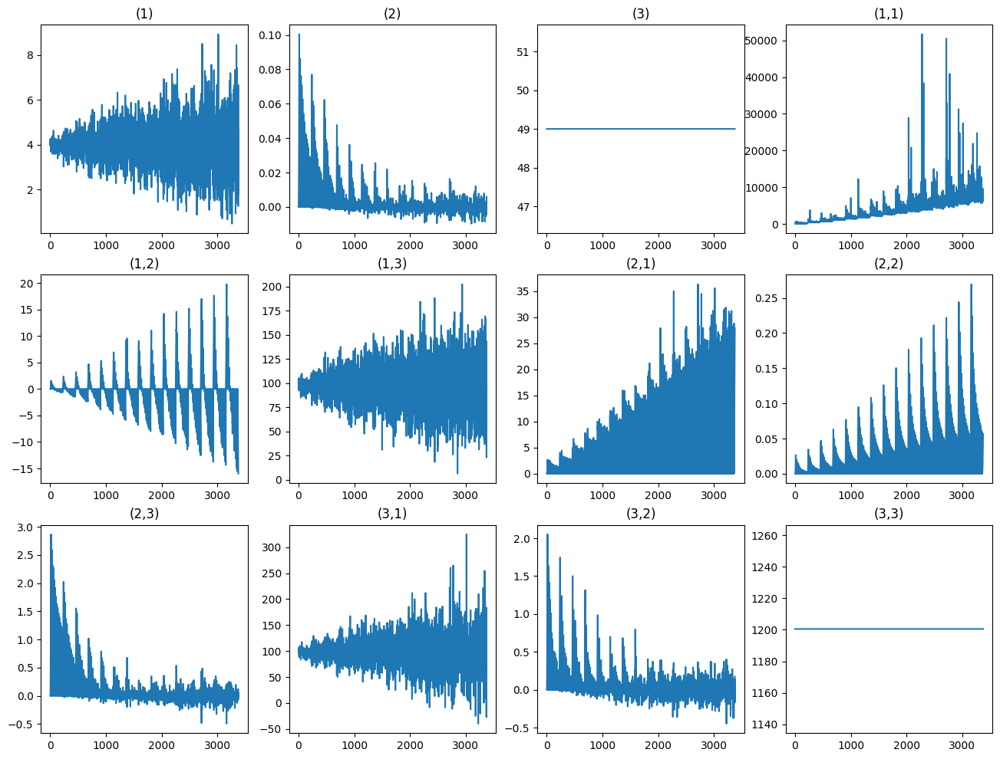

In [22]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4))
axs = axs.ravel()
for i, ax in enumerate(axs):
    ax.title.set_text(sig_keys.split()[i+1])
    ax.plot(Exp_signatures_results_thetas_and_kappas_sigmas.T[i])

In [23]:
def signatures_calculations_3_parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths):
    count=0
    for sigma in by_parameter_3["by_sigmas"]:
              for kappa in by_parameter_3["by_kappas"]:
                  for theta in by_parameter_3["by_thetas"]:
                        # Caclulation of 10000 paths of prices and sigmas
                        prices_1, sigs_1 = generate_heston_paths(S, T, r, kappa, theta, theta, rho, sigma, steps, paths,
                                                                 return_vol=True)
                        for j in range(paths):
                            prices_and_sigs_with_time_tensor[j] = torch.tensor([prices_1[j], sigs_1[j], time_array]).T
                        #     shape of prices_and_sigs_witout_time_tensor=torch.Size([10000, 100, 3])

                        sign_ps_signatory_differentranges[count] = signatory.signature(prices_and_sigs_with_time_tensor, depth_of_sig)
                        #     shape of  sign_ps_signatory_differentranges=torch.Size([512, 10000, 12])

                        Exp_sign_signatory_results[count] = torch.mean(sign_ps_signatory_differentranges[count], axis=0)
                        #     shape of  Exp_sign_signatory_results=torch.Size([512, 12])

                        count = count + 1
    return sign_ps_signatory_differentranges,Exp_sign_signatory_results

In [24]:
results_sigmas_and_kappas_thetas=signatures_calculations_3_parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths)
signatures_results_sigmas_and_kappas_thetas=results_sigmas_and_kappas_thetas[0]
Exp_signatures_results_sigmas_and_kappas_thetas=results_sigmas_and_kappas_thetas[1]

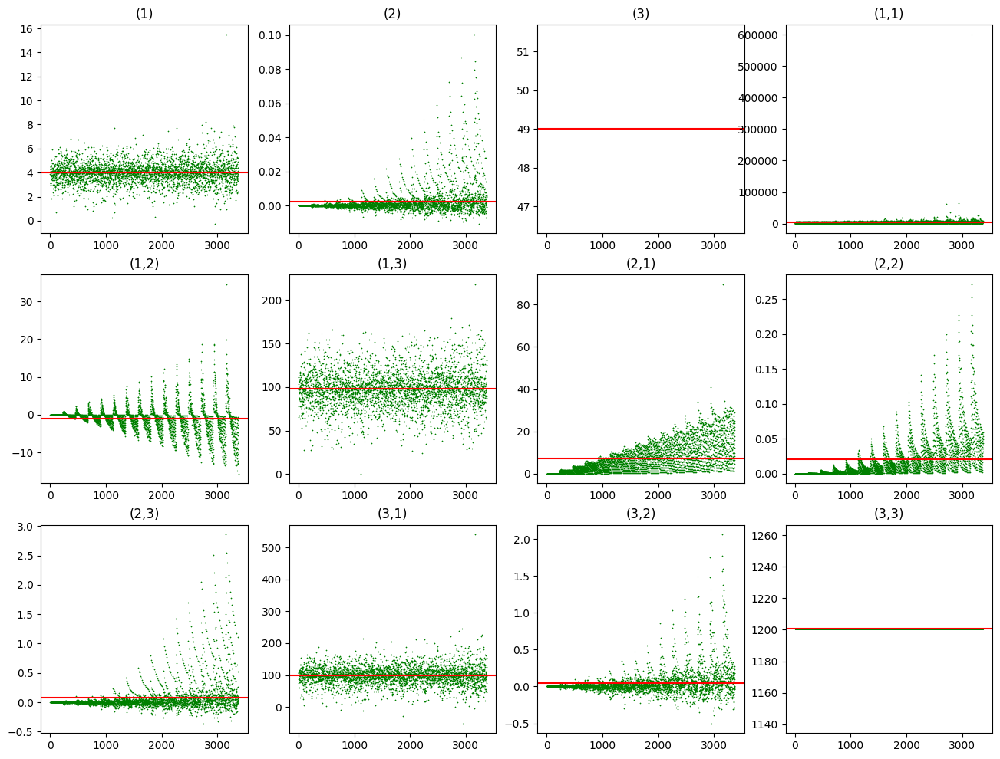

In [25]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4))
axs = axs.ravel()
for i, ax in enumerate(axs):
    ax.title.set_text(sig_keys.split()[i+1])
    ax.scatter(range(1,3376),Exp_signatures_results_sigmas_and_kappas_thetas.T[i], color='green', linewidth=0.15, s=1, alpha=1)
    ax.axhline(torch.mean(Exp_signatures_results_sigmas_and_kappas_thetas.T[i]), color='red')


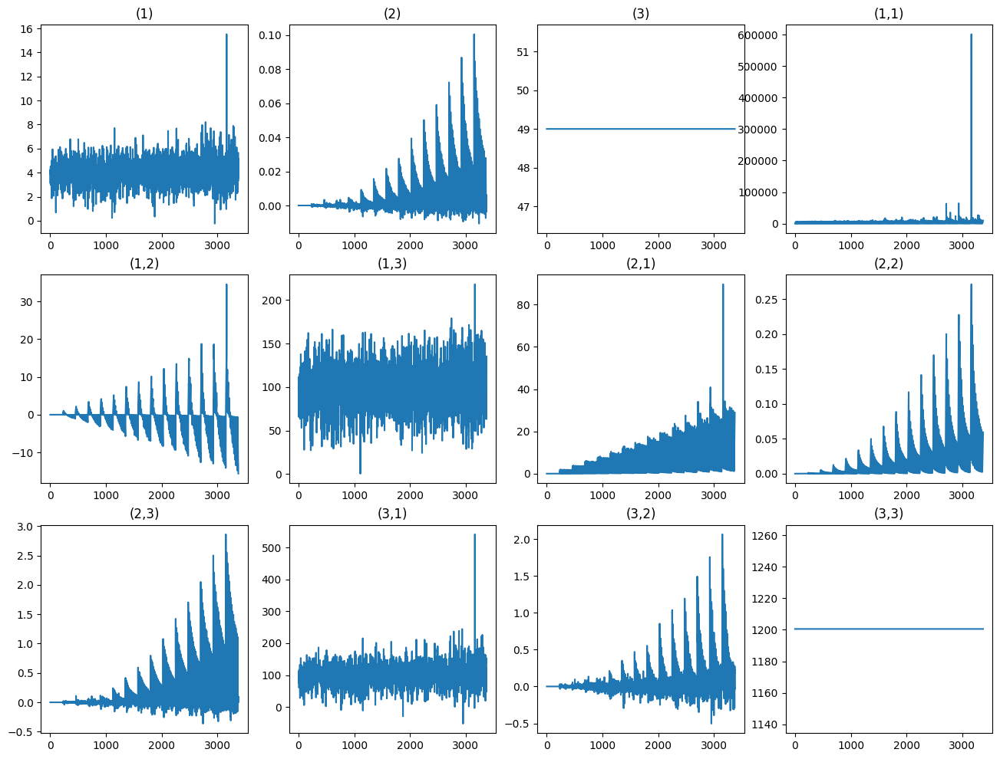

In [26]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4))
axs = axs.ravel()
for i, ax in enumerate(axs):
    ax.title.set_text(sig_keys.split()[i+1])
    ax.plot(Exp_signatures_results_sigmas_and_kappas_thetas.T[i])

In [27]:
def signatures_calculations_3_parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths):
    count=0
    for sigma in by_parameter_3["by_sigmas"]:
              for theta in by_parameter_3["by_thetas"]:
                  for kappa in by_parameter_3["by_kappas"]:
                        # Caclulation of 10000 paths of prices and sigmas
                        prices_1, sigs_1 = generate_heston_paths(S, T, r, kappa, theta, theta, rho, sigma, steps, paths,
                                                                 return_vol=True)
                        for j in range(paths):
                            prices_and_sigs_with_time_tensor[j] = torch.tensor([prices_1[j], sigs_1[j], time_array]).T
                        #     shape of prices_and_sigs_witout_time_tensor=torch.Size([10000, 100, 3])

                        sign_ps_signatory_differentranges[count] = signatory.signature(prices_and_sigs_with_time_tensor, depth_of_sig)
                        #     shape of  sign_ps_signatory_differentranges=torch.Size([512, 10000, 12])

                        Exp_sign_signatory_results[count] = torch.mean(sign_ps_signatory_differentranges[count], axis=0)
                        #     shape of  Exp_sign_signatory_results=torch.Size([512, 12])

                        count = count + 1
    return sign_ps_signatory_differentranges,Exp_sign_signatory_results

In [28]:
results_sigmas_and_thetas_kappas=signatures_calculations_3_parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths)
signatures_results_sigmas_and_thetas_kappas=results_sigmas_and_thetas_kappas[0]
Exp_signatures_results_sigmas_and_thetas_kappas=results_sigmas_and_thetas_kappas[1]

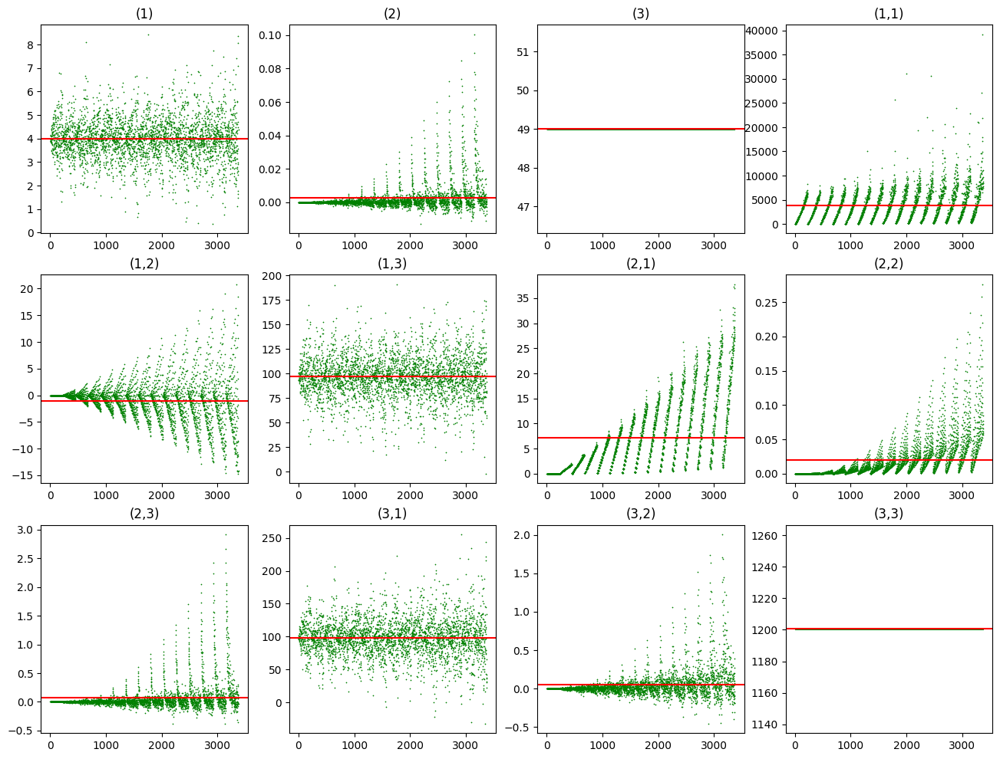

In [29]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4))
axs = axs.ravel()
for i, ax in enumerate(axs):
    ax.title.set_text(sig_keys.split()[i+1])
    ax.scatter(range(1,3376),Exp_signatures_results_sigmas_and_thetas_kappas.T[i], color='green', linewidth=0.15, s=1, alpha=1)
    ax.axhline(torch.mean(Exp_signatures_results_sigmas_and_thetas_kappas.T[i]), color='red')

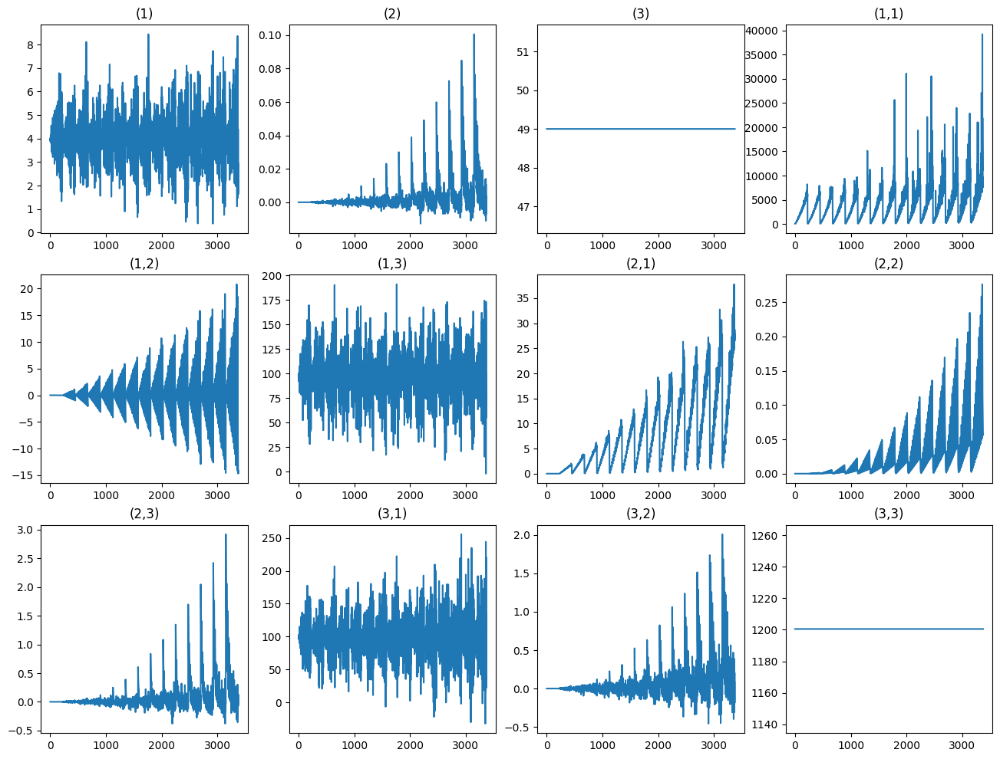

In [30]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4))
axs = axs.ravel()
for i, ax in enumerate(axs):
    ax.title.set_text(sig_keys.split()[i+1])
    ax.plot(Exp_signatures_results_sigmas_and_thetas_kappas.T[i])

In [31]:
def signatures_calculations_3_parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths):
    count=0
    for theta in by_parameter_3["by_thetas"]:
              for sigma in by_parameter_3["by_sigmas"]:
                  for kappa in by_parameter_3["by_kappas"]:
                        # Caclulation of 10000 paths of prices and sigmas
                        prices_1, sigs_1 = generate_heston_paths(S, T, r, kappa, theta, theta, rho, sigma, steps, paths,
                                                                 return_vol=True)
                        for j in range(paths):
                            prices_and_sigs_with_time_tensor[j] = torch.tensor([prices_1[j], sigs_1[j], time_array]).T
                        #     shape of prices_and_sigs_witout_time_tensor=torch.Size([10000, 100, 3])

                        sign_ps_signatory_differentranges[count] = signatory.signature(prices_and_sigs_with_time_tensor, depth_of_sig)
                        #     shape of  sign_ps_signatory_differentranges=torch.Size([512, 10000, 12])

                        Exp_sign_signatory_results[count] = torch.mean(sign_ps_signatory_differentranges[count], axis=0)
                        #     shape of  Exp_sign_signatory_results=torch.Size([512, 12])

                        count = count + 1
    return sign_ps_signatory_differentranges,Exp_sign_signatory_results

In [32]:
results_thetas_and_sigmas_kappas=signatures_calculations_3_parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths)
signatures_results_thetas_and_sigmas_kappas=results_thetas_and_sigmas_kappas[0]
Exp_signatures_results_thetas_and_sigmas_kappas=results_thetas_and_sigmas_kappas[1]

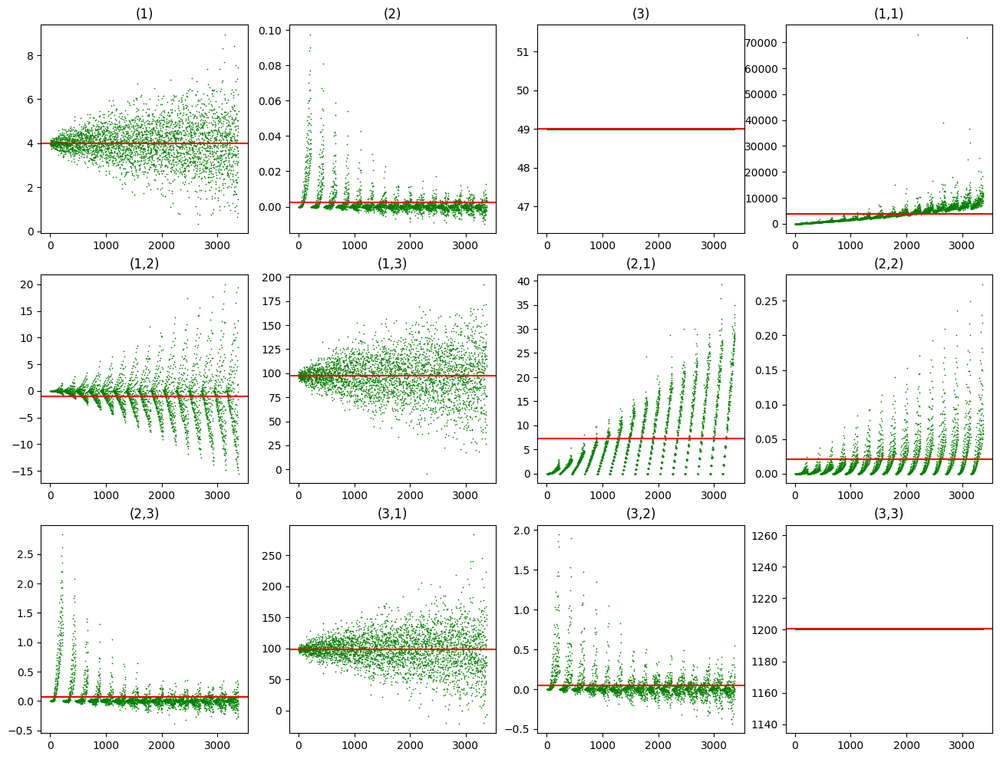

In [33]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4))
axs = axs.ravel()
for i, ax in enumerate(axs):
    ax.title.set_text(sig_keys.split()[i+1])
    ax.scatter(range(1,3376),Exp_signatures_results_thetas_and_sigmas_kappas.T[i], color='green', linewidth=0.15, s=1, alpha=1)
    ax.axhline(torch.mean(Exp_signatures_results_thetas_and_sigmas_kappas.T[i]), color='red')

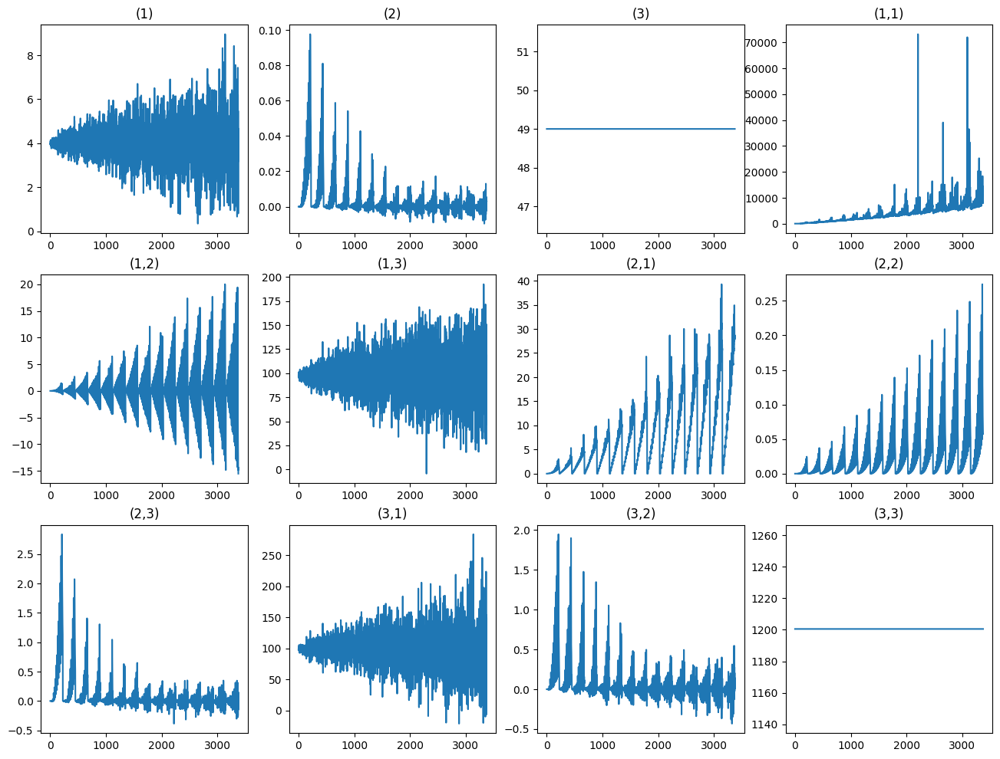

In [34]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4))
axs = axs.ravel()
for i, ax in enumerate(axs):
    ax.title.set_text(sig_keys.split()[i+1])
    ax.plot(Exp_signatures_results_thetas_and_sigmas_kappas.T[i])

In [35]:
def signatures_calculations_3_parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths):
    count=0
    for kappa in by_parameter_3["by_kappas"]:
              for sigma in by_parameter_3["by_sigmas"]:
                  for theta in by_parameter_3["by_thetas"]:
                        # Caclulation of 10000 paths of prices and sigmas
                        prices_1, sigs_1 = generate_heston_paths(S, T, r, kappa, theta, theta, rho, sigma, steps, paths,
                                                                 return_vol=True)
                        for j in range(paths):
                            prices_and_sigs_with_time_tensor[j] = torch.tensor([prices_1[j], sigs_1[j], time_array]).T
                        #     shape of prices_and_sigs_witout_time_tensor=torch.Size([10000, 100, 3])

                        sign_ps_signatory_differentranges[count] = signatory.signature(prices_and_sigs_with_time_tensor, depth_of_sig)
                        #     shape of  sign_ps_signatory_differentranges=torch.Size([512, 10000, 12])

                        Exp_sign_signatory_results[count] = torch.mean(sign_ps_signatory_differentranges[count], axis=0)
                        #     shape of  Exp_sign_signatory_results=torch.Size([512, 12])

                        count = count + 1
    return sign_ps_signatory_differentranges,Exp_sign_signatory_results

In [36]:
results_kappas_and_sigmas_thetas=signatures_calculations_3_parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths)
signatures_results_kappas_and_sigmas_thetas=results_kappas_and_sigmas_thetas[0]
Exp_signatures_results_kappas_and_sigmas_thetas=results_kappas_and_sigmas_thetas[1]

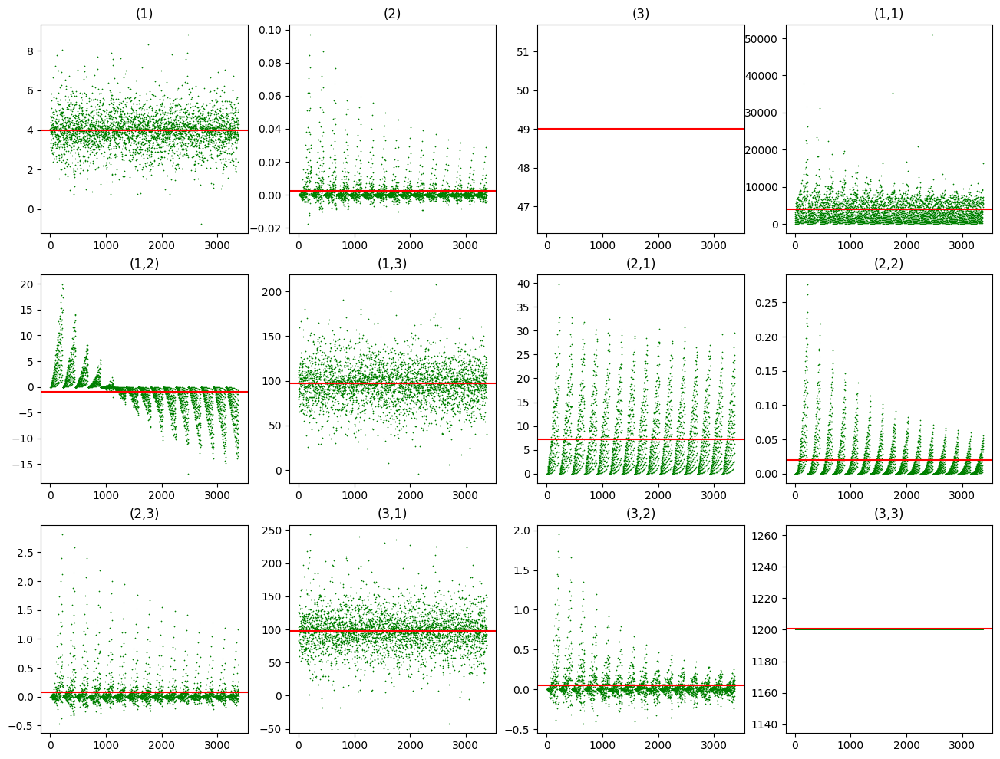

In [37]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4))
axs = axs.ravel()
for i, ax in enumerate(axs):
    ax.title.set_text(sig_keys.split()[i+1])
    ax.scatter(range(1,3376),Exp_signatures_results_kappas_and_sigmas_thetas.T[i], color='green', linewidth=0.15, s=1, alpha=1)
    ax.axhline(torch.mean(Exp_signatures_results_kappas_and_sigmas_thetas.T[i]), color='red')

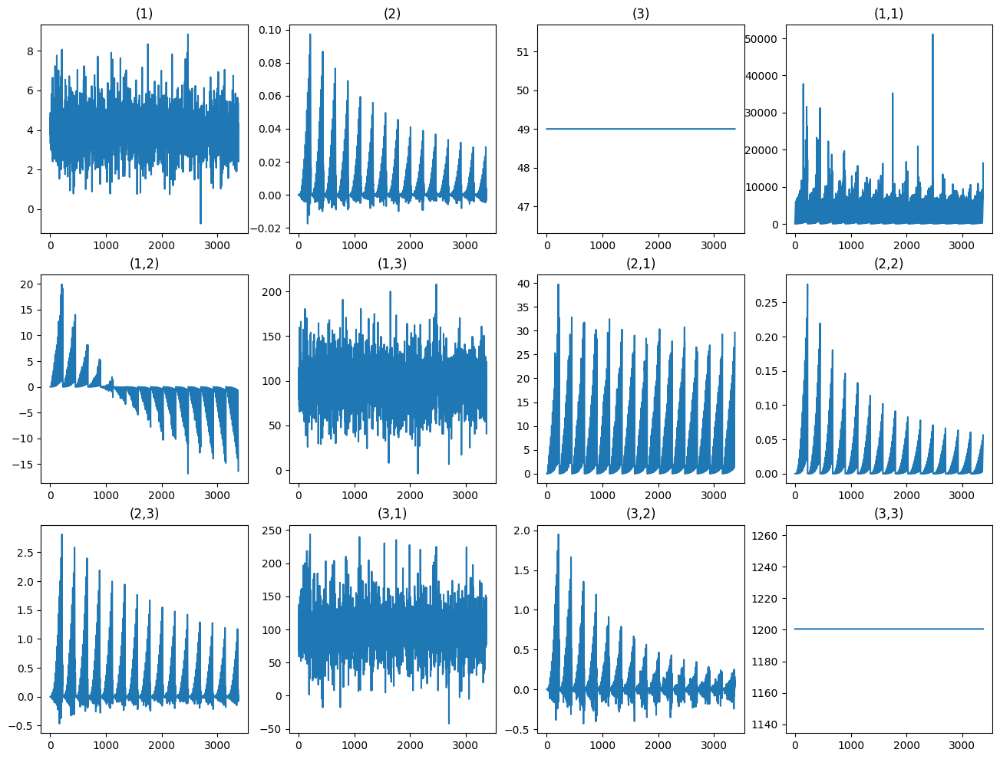

In [38]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4))
axs = axs.ravel()
for i, ax in enumerate(axs):
    ax.title.set_text(sig_keys.split()[i+1])
    ax.plot(Exp_signatures_results_kappas_and_sigmas_thetas.T[i])

In [8]:
number_of_loops=by_parameter_3["by_kappas"].shape[0]*by_parameter_3["by_rhos"].shape[0]*by_parameter_3["by_sigmas"].shape[0]
sign_ps_signatory_differentranges=torch.zeros((number_of_loops,paths,sig_dim))
Exp_sign_signatory_results=torch.zeros((number_of_loops,sig_dim))
# sign_ps_signatory_differentranges[0].shape

In [10]:
def signatures_calculations_3_parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths):
    count=0
    for kappa in by_parameter_3["by_kappas"]:
              for sigma in by_parameter_3["by_sigmas"]:
                  for rho in by_parameter_3["by_rhos"]:
                        # Caclulation of 10000 paths of prices and sigmas
                        prices_1, sigs_1 = generate_heston_paths(S, T, r, kappa, theta, theta, rho, sigma, steps, paths,
                                                                 return_vol=True)
                        for j in range(paths):
                            prices_and_sigs_with_time_tensor[j] = torch.tensor([prices_1[j], sigs_1[j], time_array]).T
                        #     shape of prices_and_sigs_witout_time_tensor=torch.Size([10000, 100, 3])

                        sign_ps_signatory_differentranges[count] = signatory.signature(prices_and_sigs_with_time_tensor, depth_of_sig)
                        #     shape of  sign_ps_signatory_differentranges=torch.Size([512, 10000, 12])

                        Exp_sign_signatory_results[count] = torch.mean(sign_ps_signatory_differentranges[count], axis=0)
                        #     shape of  Exp_sign_signatory_results=torch.Size([512, 12])

                        count = count + 1
    return sign_ps_signatory_differentranges,Exp_sign_signatory_results

In [11]:
results_kappas_and_sigmas_rhos=signatures_calculations_3_parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths)
signatures_results_kappas_and_sigmas_rhos=results_kappas_and_sigmas_rhos[0]
Exp_signatures_results_kappas_and_sigmas_rhos=results_kappas_and_sigmas_rhos[1]

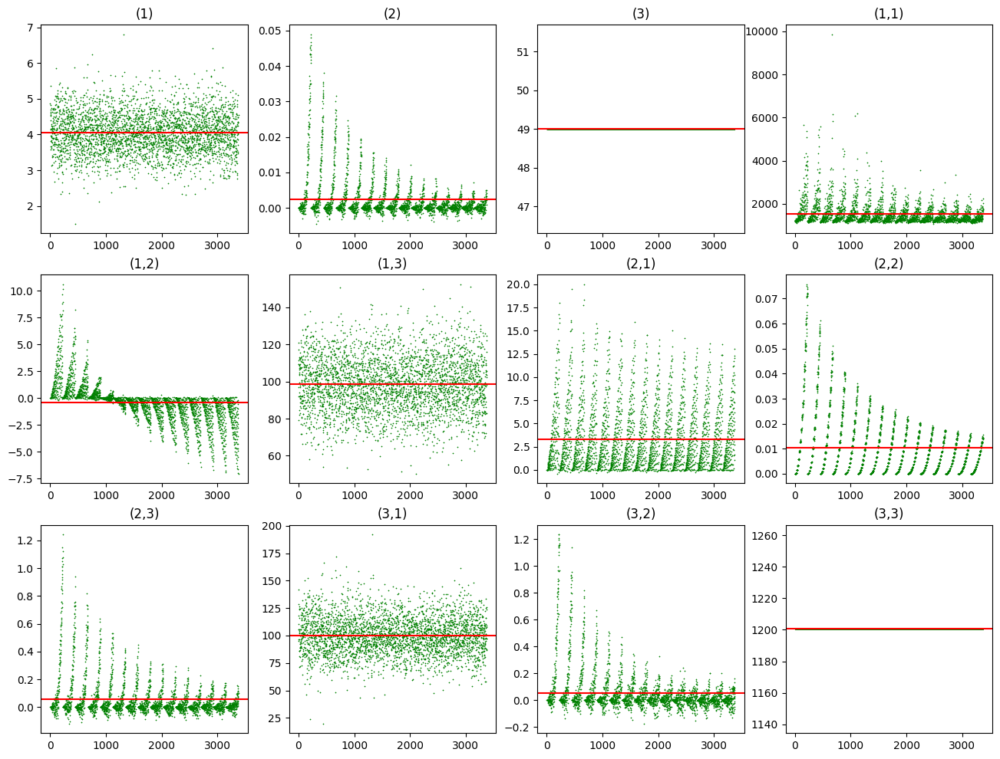

In [12]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4))
axs = axs.ravel()
for i, ax in enumerate(axs):
    ax.title.set_text(sig_keys.split()[i+1])
    ax.scatter(range(1,3376),Exp_signatures_results_kappas_and_sigmas_rhos.T[i], color='green', linewidth=0.15, s=1, alpha=1)
    ax.axhline(torch.mean(Exp_signatures_results_kappas_and_sigmas_rhos.T[i]), color='red')

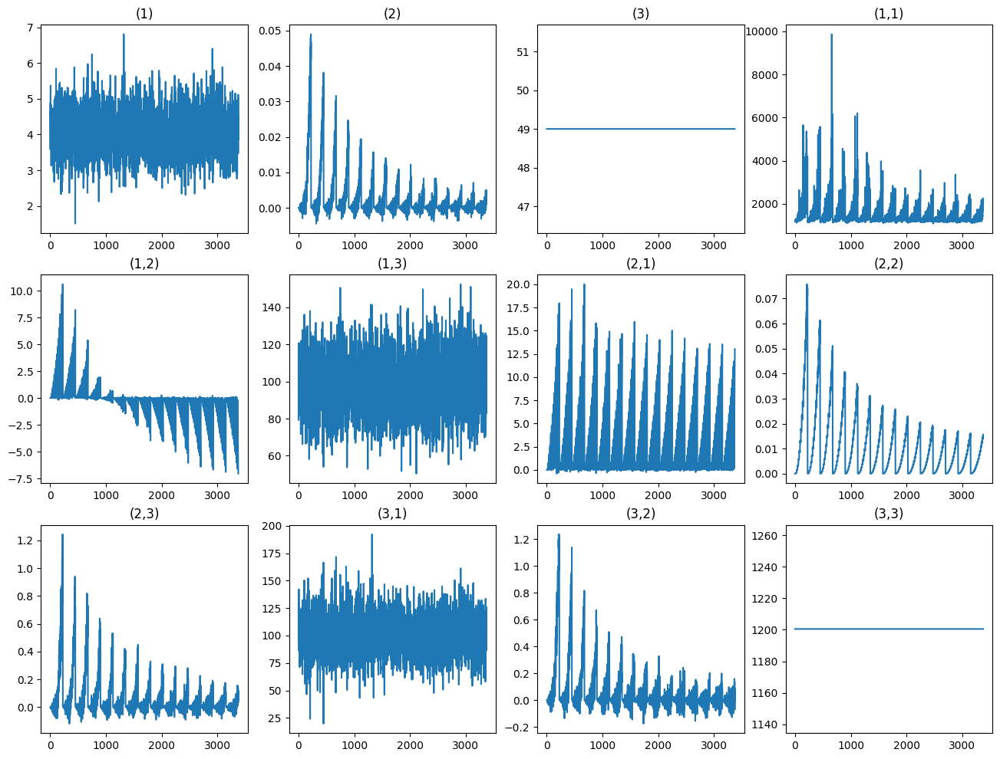

In [13]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4))
axs = axs.ravel()
for i, ax in enumerate(axs):
    ax.title.set_text(sig_keys.split()[i+1])
    ax.plot(Exp_signatures_results_kappas_and_sigmas_rhos.T[i])

In [14]:
def signatures_calculations_3_parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths):
    count=0
    for kappa in by_parameter_3["by_kappas"]:
              for rho in by_parameter_3["by_rhos"]:
                  for sigma in by_parameter_3["by_sigmas"]:
                        # Caclulation of 10000 paths of prices and sigmas
                        prices_1, sigs_1 = generate_heston_paths(S, T, r, kappa, theta, theta, rho, sigma, steps, paths,
                                                                 return_vol=True)
                        for j in range(paths):
                            prices_and_sigs_with_time_tensor[j] = torch.tensor([prices_1[j], sigs_1[j], time_array]).T
                        #     shape of prices_and_sigs_witout_time_tensor=torch.Size([10000, 100, 3])

                        sign_ps_signatory_differentranges[count] = signatory.signature(prices_and_sigs_with_time_tensor, depth_of_sig)
                        #     shape of  sign_ps_signatory_differentranges=torch.Size([512, 10000, 12])

                        Exp_sign_signatory_results[count] = torch.mean(sign_ps_signatory_differentranges[count], axis=0)
                        #     shape of  Exp_sign_signatory_results=torch.Size([512, 12])

                        count = count + 1
    return sign_ps_signatory_differentranges,Exp_sign_signatory_results

In [15]:
results_kappas_and_rhos_sigmas=signatures_calculations_3_parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths)
signatures_results_kappas_and_rhos_sigmas=results_kappas_and_rhos_sigmas[0]
Exp_signatures_results_kappas_and_rhos_sigmas=results_kappas_and_rhos_sigmas[1]

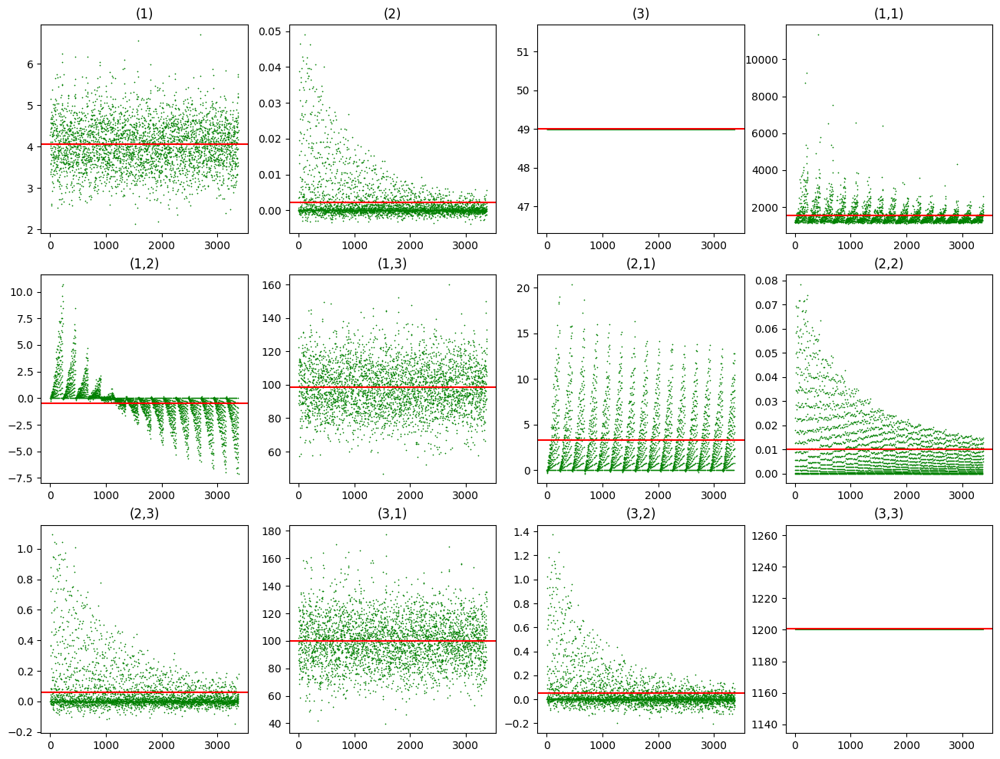

In [16]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4))
axs = axs.ravel()
for i, ax in enumerate(axs):
    ax.title.set_text(sig_keys.split()[i+1])
    ax.scatter(range(1,3376),Exp_signatures_results_kappas_and_rhos_sigmas.T[i], color='green', linewidth=0.15, s=1, alpha=1)
    ax.axhline(torch.mean(Exp_signatures_results_kappas_and_rhos_sigmas.T[i]), color='red')

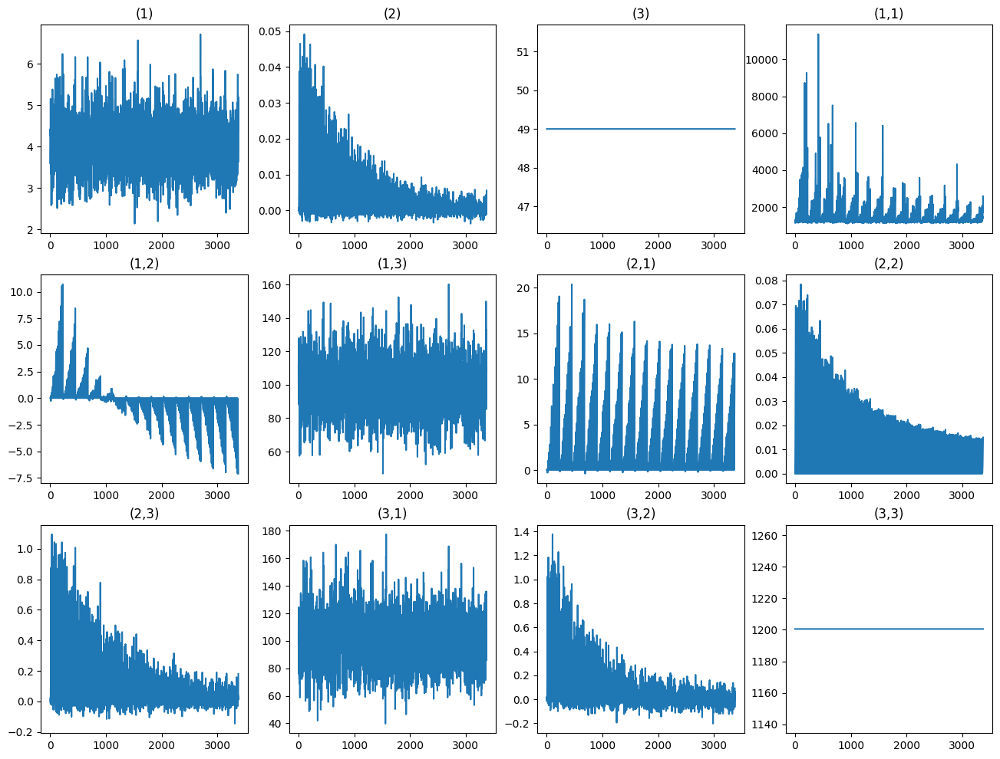

In [17]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4))
axs = axs.ravel()
for i, ax in enumerate(axs):
    ax.title.set_text(sig_keys.split()[i+1])
    ax.plot(Exp_signatures_results_kappas_and_rhos_sigmas.T[i])

In [17]:
def signatures_calculations_3_parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths):
    count=0
    for rho in by_parameter_3["by_rhos"]:
              for sigma in by_parameter_3["by_sigmas"]:
                  for kappa in by_parameter_3["by_kappas"]:
                        # Caclulation of 10000 paths of prices and sigmas
                        prices_1, sigs_1 = generate_heston_paths(S, T, r, kappa, theta, theta, rho, sigma, steps, paths,
                                                                 return_vol=True)
                        for j in range(paths):
                            prices_and_sigs_with_time_tensor[j] = torch.tensor([prices_1[j], sigs_1[j], time_array]).T
                        #     shape of prices_and_sigs_witout_time_tensor=torch.Size([10000, 100, 3])

                        sign_ps_signatory_differentranges[count] = signatory.signature(prices_and_sigs_with_time_tensor, depth_of_sig)
                        #     shape of  sign_ps_signatory_differentranges=torch.Size([512, 10000, 12])

                        Exp_sign_signatory_results[count] = torch.mean(sign_ps_signatory_differentranges[count], axis=0)
                        #     shape of  Exp_sign_signatory_results=torch.Size([512, 12])

                        count = count + 1
    return sign_ps_signatory_differentranges,Exp_sign_signatory_results

In [18]:
results_rhos_and_sigmas_kappas=signatures_calculations_3_parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths)
signatures_results_rhos_and_sigmas_kappas=results_rhos_and_sigmas_kappas[0]
Exp_signatures_results_rhos_and_sigmas_kappas=results_rhos_and_sigmas_kappas[1]

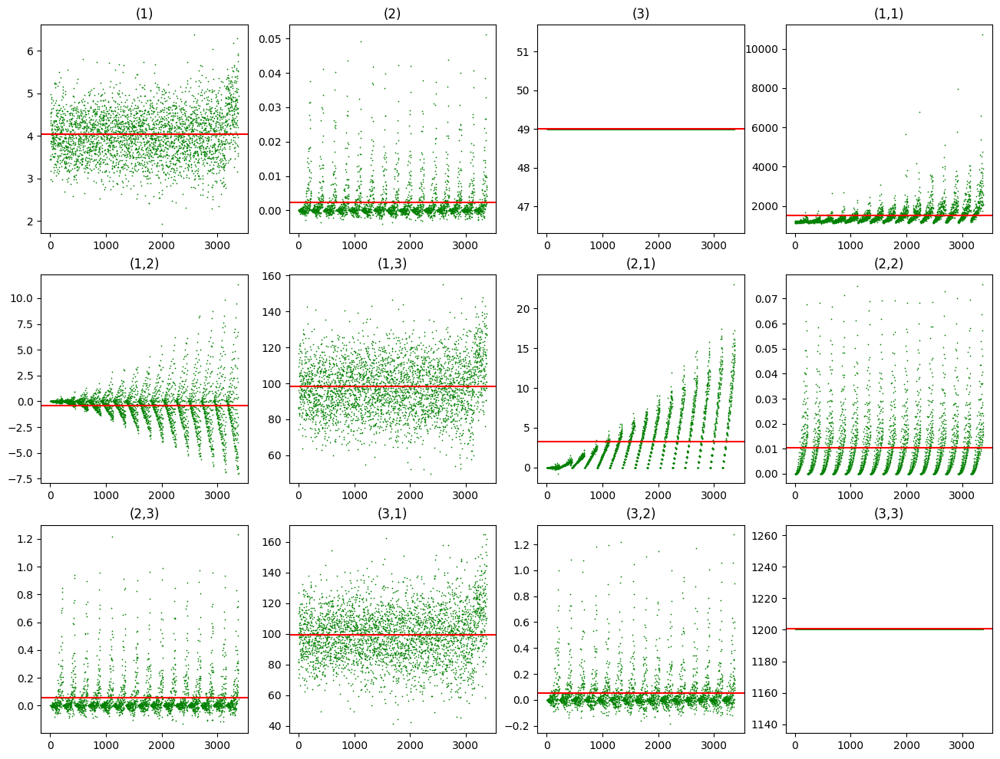

In [19]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4))
axs = axs.ravel()
for i, ax in enumerate(axs):
    ax.title.set_text(sig_keys.split()[i+1])
    ax.scatter(range(1,3376),Exp_signatures_results_rhos_and_sigmas_kappas.T[i], color='green', linewidth=0.15, s=1, alpha=1)
    ax.axhline(torch.mean(Exp_signatures_results_rhos_and_sigmas_kappas.T[i]), color='red')

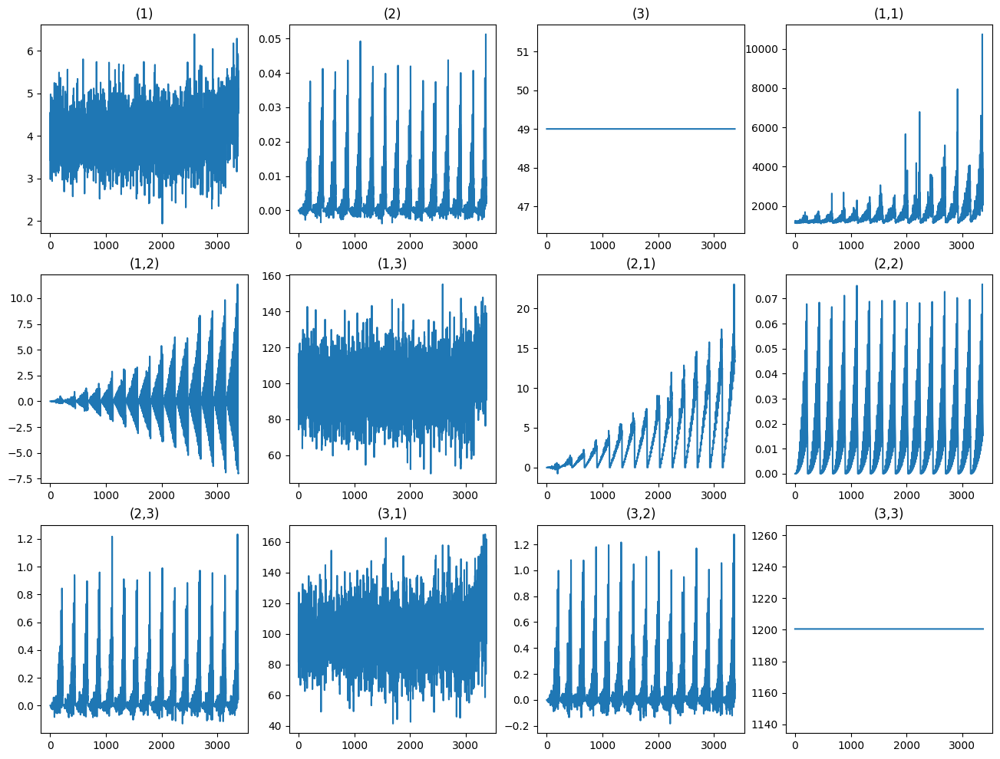

In [20]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4))
axs = axs.ravel()
for i, ax in enumerate(axs):
    ax.title.set_text(sig_keys.split()[i+1])
    ax.plot(Exp_signatures_results_rhos_and_sigmas_kappas.T[i])

In [13]:
def signatures_calculations_3_parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths):
    count=0
    for rho in by_parameter_3["by_rhos"]:
              for kappa in by_parameter_3["by_kappas"]:
                  for sigma in by_parameter_3["by_sigmas"]:
                        # Caclulation of 10000 paths of prices and sigmas
                        prices_1, sigs_1 = generate_heston_paths(S, T, r, kappa, theta, theta, rho, sigma, steps, paths,
                                                                 return_vol=True)
                        for j in range(paths):
                            prices_and_sigs_with_time_tensor[j] = torch.tensor([prices_1[j], sigs_1[j], time_array]).T
                        #     shape of prices_and_sigs_witout_time_tensor=torch.Size([10000, 100, 3])

                        sign_ps_signatory_differentranges[count] = signatory.signature(prices_and_sigs_with_time_tensor, depth_of_sig)
                        #     shape of  sign_ps_signatory_differentranges=torch.Size([512, 10000, 12])

                        Exp_sign_signatory_results[count] = torch.mean(sign_ps_signatory_differentranges[count], axis=0)
                        #     shape of  Exp_sign_signatory_results=torch.Size([512, 12])

                        count = count + 1
    return sign_ps_signatory_differentranges,Exp_sign_signatory_results

In [14]:
results_rhos_and_kappas_sigmas=signatures_calculations_3_parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths)
signatures_results_rhos_and_kappas_sigmas=results_rhos_and_kappas_sigmas[0]
Exp_signatures_results_rhos_and_kappas_sigmas=results_rhos_and_kappas_sigmas[1]

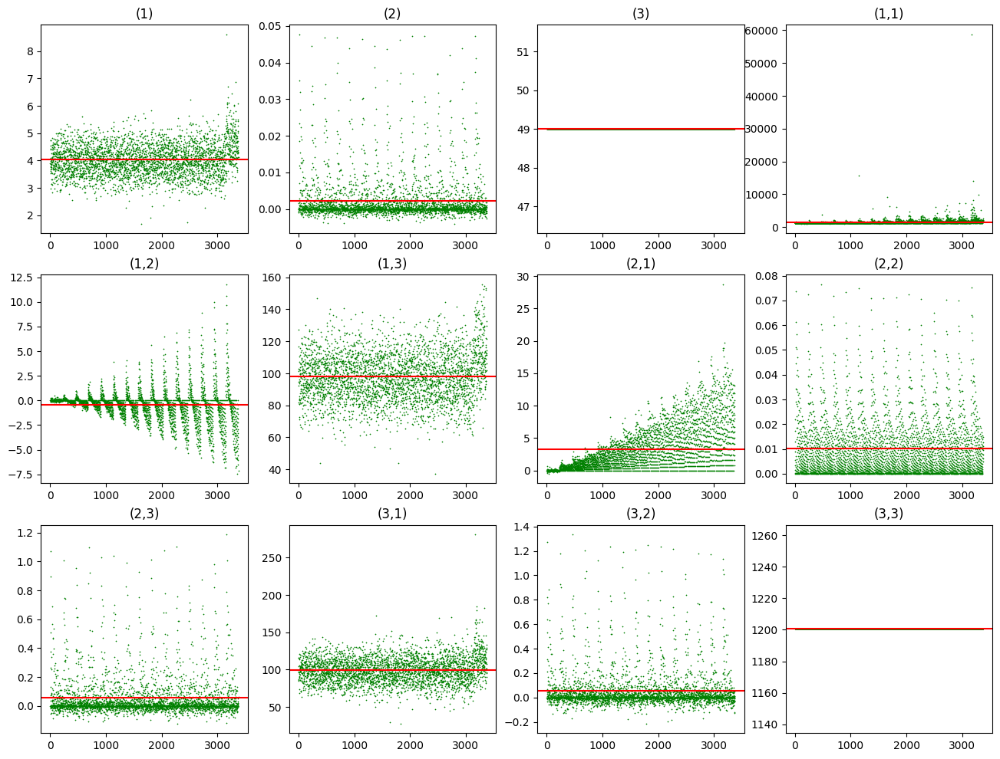

In [15]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4))
axs = axs.ravel()
for i, ax in enumerate(axs):
    ax.title.set_text(sig_keys.split()[i+1])
    ax.scatter(range(1,3376),Exp_signatures_results_rhos_and_kappas_sigmas.T[i], color='green', linewidth=0.15, s=1, alpha=1)
    ax.axhline(torch.mean(Exp_signatures_results_rhos_and_kappas_sigmas.T[i]), color='red')

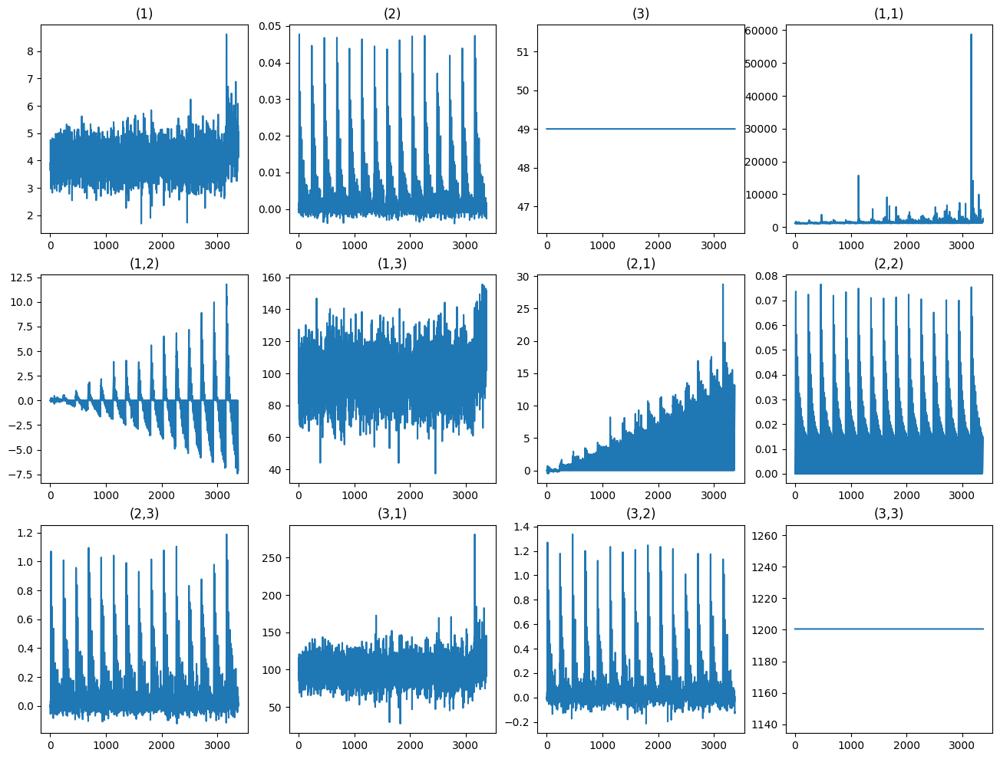

In [16]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4))
axs = axs.ravel()
for i, ax in enumerate(axs):
    ax.title.set_text(sig_keys.split()[i+1])
    ax.plot(Exp_signatures_results_rhos_and_kappas_sigmas.T[i])

In [22]:
def signatures_calculations_3_parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths):
    count=0
    for sigma in by_parameter_3["by_sigmas"]:
              for rho in by_parameter_3["by_rhos"]:
                  for kappa in by_parameter_3["by_kappas"]:
                        # Caclulation of 10000 paths of prices and sigmas
                        prices_1, sigs_1 = generate_heston_paths(S, T, r, kappa, theta, theta, rho, sigma, steps, paths,
                                                                 return_vol=True)
                        for j in range(paths):
                            prices_and_sigs_with_time_tensor[j] = torch.tensor([prices_1[j], sigs_1[j], time_array]).T
                        #     shape of prices_and_sigs_witout_time_tensor=torch.Size([10000, 100, 3])

                        sign_ps_signatory_differentranges[count] = signatory.signature(prices_and_sigs_with_time_tensor, depth_of_sig)
                        #     shape of  sign_ps_signatory_differentranges=torch.Size([512, 10000, 12])

                        Exp_sign_signatory_results[count] = torch.mean(sign_ps_signatory_differentranges[count], axis=0)
                        #     shape of  Exp_sign_signatory_results=torch.Size([512, 12])

                        count = count + 1
    return sign_ps_signatory_differentranges,Exp_sign_signatory_results

In [23]:
results_sigmas_and_rhos_kappas=signatures_calculations_3_parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths)
signatures_results_sigmas_and_rhos_kappas=results_sigmas_and_rhos_kappas[0]
Exp_signatures_results_sigmas_and_rhos_kappas=results_sigmas_and_rhos_kappas[1]

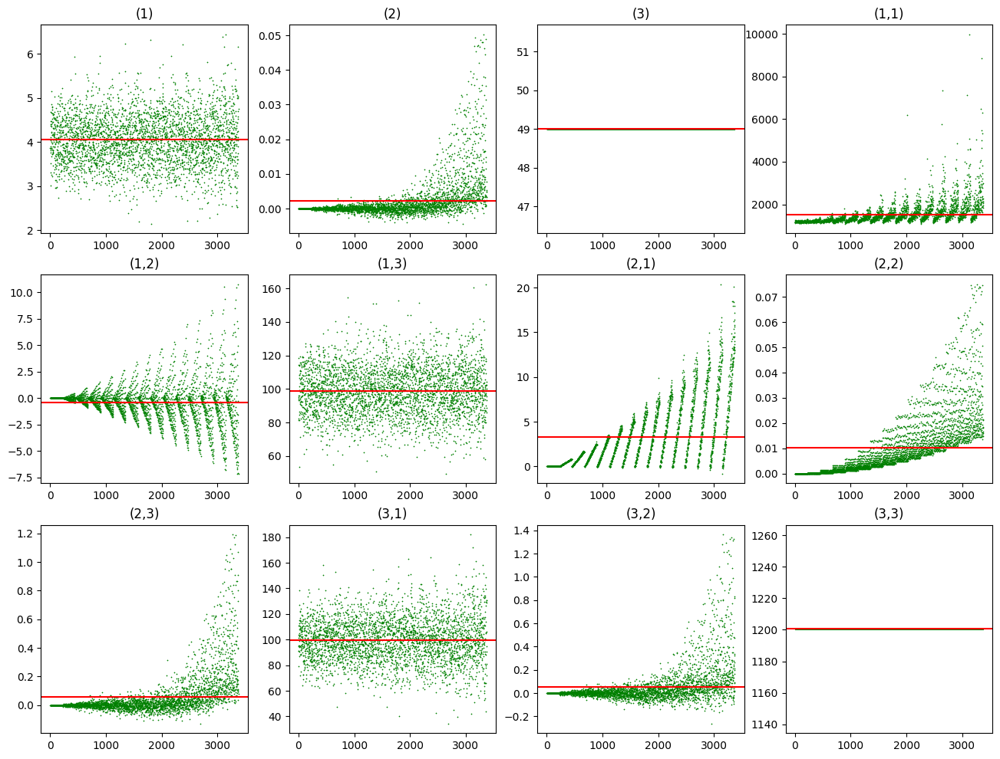

In [24]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4))
axs = axs.ravel()
for i, ax in enumerate(axs):
    ax.title.set_text(sig_keys.split()[i+1])
    ax.scatter(range(1,3376),Exp_signatures_results_sigmas_and_rhos_kappas.T[i], color='green', linewidth=0.15, s=1, alpha=1)
    ax.axhline(torch.mean(Exp_signatures_results_sigmas_and_rhos_kappas.T[i]), color='red')

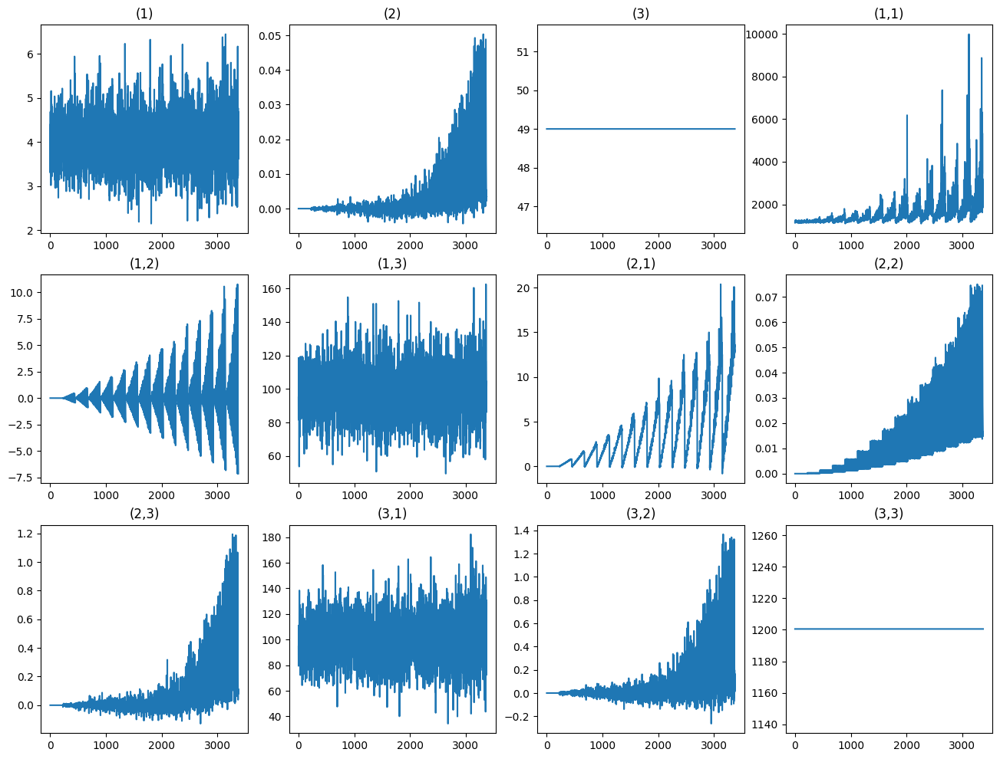

In [25]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4))
axs = axs.ravel()
for i, ax in enumerate(axs):
    ax.title.set_text(sig_keys.split()[i+1])
    ax.plot(Exp_signatures_results_sigmas_and_rhos_kappas.T[i])

In [26]:
def signatures_calculations_3_parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths):
    count=0
    for sigma in by_parameter_3["by_sigmas"]:
              for kappa in by_parameter_3["by_kappas"]:
                  for rho in by_parameter_3["by_rhos"]:
                        # Caclulation of 10000 paths of prices and sigmas
                        prices_1, sigs_1 = generate_heston_paths(S, T, r, kappa, theta, theta, rho, sigma, steps, paths,
                                                                 return_vol=True)
                        for j in range(paths):
                            prices_and_sigs_with_time_tensor[j] = torch.tensor([prices_1[j], sigs_1[j], time_array]).T
                        #     shape of prices_and_sigs_witout_time_tensor=torch.Size([10000, 100, 3])

                        sign_ps_signatory_differentranges[count] = signatory.signature(prices_and_sigs_with_time_tensor, depth_of_sig)
                        #     shape of  sign_ps_signatory_differentranges=torch.Size([512, 10000, 12])

                        Exp_sign_signatory_results[count] = torch.mean(sign_ps_signatory_differentranges[count], axis=0)
                        #     shape of  Exp_sign_signatory_results=torch.Size([512, 12])

                        count = count + 1
    return sign_ps_signatory_differentranges,Exp_sign_signatory_results

In [27]:
results_sigmas_and_kappas_rhos=signatures_calculations_3_parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths)
signatures_results_sigmas_and_kappas_rhos=results_sigmas_and_kappas_rhos[0]
Exp_signatures_results_sigmas_and_kappas_rhos=results_sigmas_and_kappas_rhos[1]

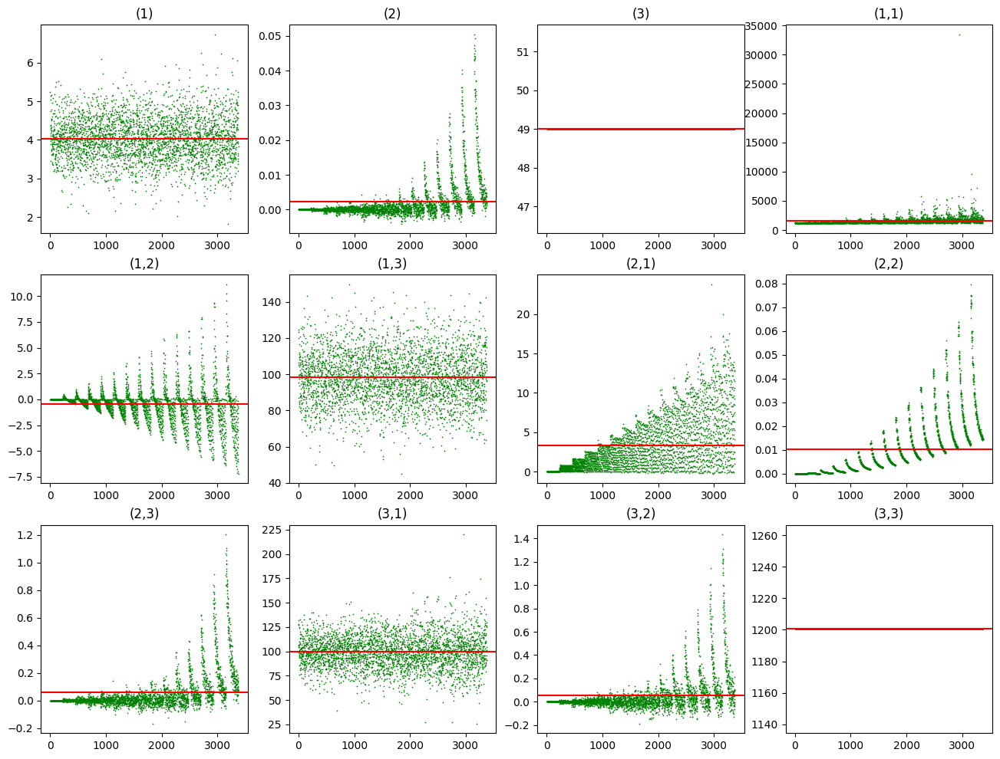

In [28]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4))
axs = axs.ravel()
for i, ax in enumerate(axs):
    ax.title.set_text(sig_keys.split()[i+1])
    ax.scatter(range(1,3376),Exp_signatures_results_sigmas_and_kappas_rhos.T[i], color='green', linewidth=0.15, s=1, alpha=1)
    ax.axhline(torch.mean(Exp_signatures_results_sigmas_and_kappas_rhos.T[i]), color='red')

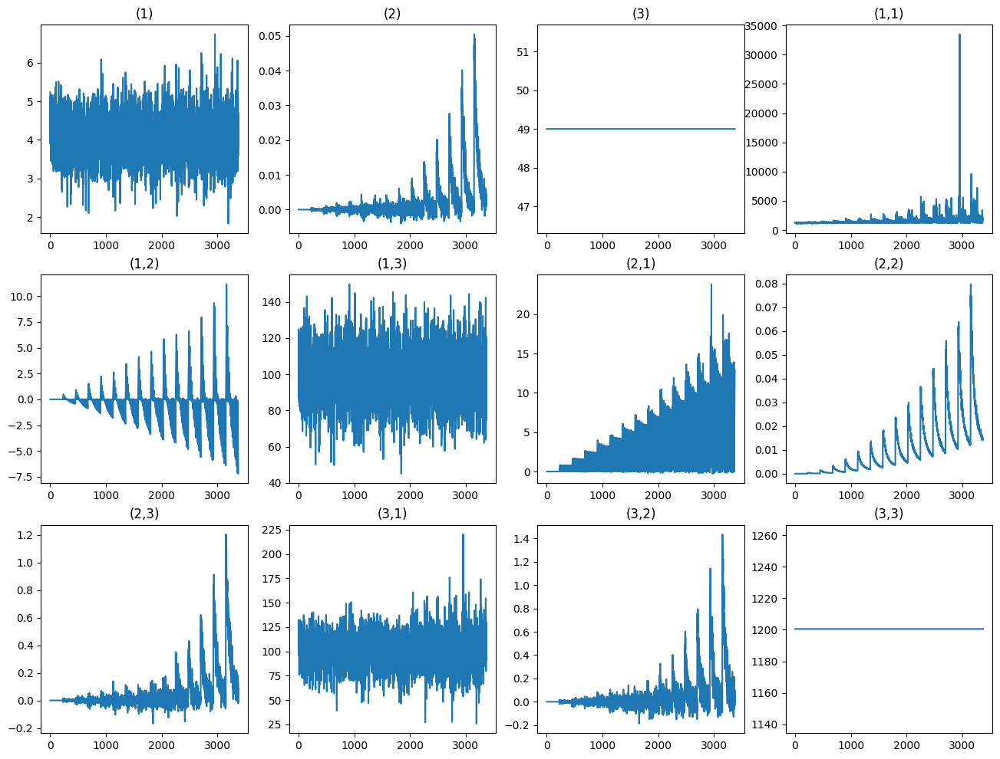

In [29]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4))
axs = axs.ravel()
for i, ax in enumerate(axs):
    ax.title.set_text(sig_keys.split()[i+1])
    ax.plot(Exp_signatures_results_sigmas_and_kappas_rhos.T[i])

In [30]:
number_of_loops=by_parameter_3["by_kappas"].shape[0]*by_parameter_3["by_thetas"].shape[0]*by_parameter_3["by_rhos"].shape[0]
sign_ps_signatory_differentranges=torch.zeros((number_of_loops,paths,sig_dim))
Exp_sign_signatory_results=torch.zeros((number_of_loops,sig_dim))
# sign_ps_signatory_differentranges[0].shape

In [31]:
def signatures_calculations_3_parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths):
    count=0
    for rho in by_parameter_3["by_rhos"]:
              for theta in by_parameter_3["by_thetas"]:
                  for kappa in by_parameter_3["by_kappas"]:
                        # Caclulation of 10000 paths of prices and sigmas
                        prices_1, sigs_1 = generate_heston_paths(S, T, r, kappa, theta, theta, rho, sigma, steps, paths,
                                                                 return_vol=True)
                        for j in range(paths):
                            prices_and_sigs_with_time_tensor[j] = torch.tensor([prices_1[j], sigs_1[j], time_array]).T
                        #     shape of prices_and_sigs_witout_time_tensor=torch.Size([10000, 100, 3])

                        sign_ps_signatory_differentranges[count] = signatory.signature(prices_and_sigs_with_time_tensor, depth_of_sig)
                        #     shape of  sign_ps_signatory_differentranges=torch.Size([512, 10000, 12])

                        Exp_sign_signatory_results[count] = torch.mean(sign_ps_signatory_differentranges[count], axis=0)
                        #     shape of  Exp_sign_signatory_results=torch.Size([512, 12])

                        count = count + 1
    return sign_ps_signatory_differentranges,Exp_sign_signatory_results

In [ ]:
results_rhos_and_thetas_kappas=signatures_calculations_3_parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths)
signatures_results_rhos_and_thetas_kappas=results_rhos_and_thetas_kappas[0]
Exp_signatures_results_rhos_and_thetas_kappas=results_rhos_and_thetas_kappas[1]

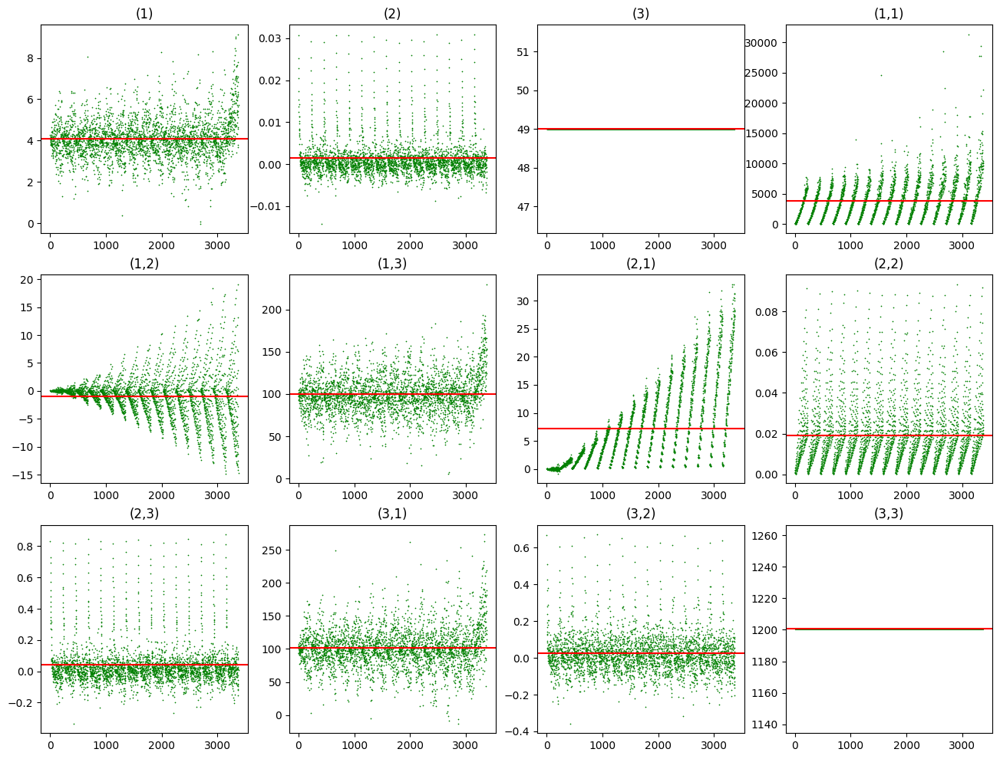

In [ ]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4))
axs = axs.ravel()
for i, ax in enumerate(axs):
    ax.title.set_text(sig_keys.split()[i+1])
    ax.scatter(range(1,3376),Exp_signatures_results_rhos_and_thetas_kappas.T[i], color='green', linewidth=0.15, s=1, alpha=1)
    ax.axhline(torch.mean(Exp_signatures_results_rhos_and_thetas_kappas.T[i]), color='red')

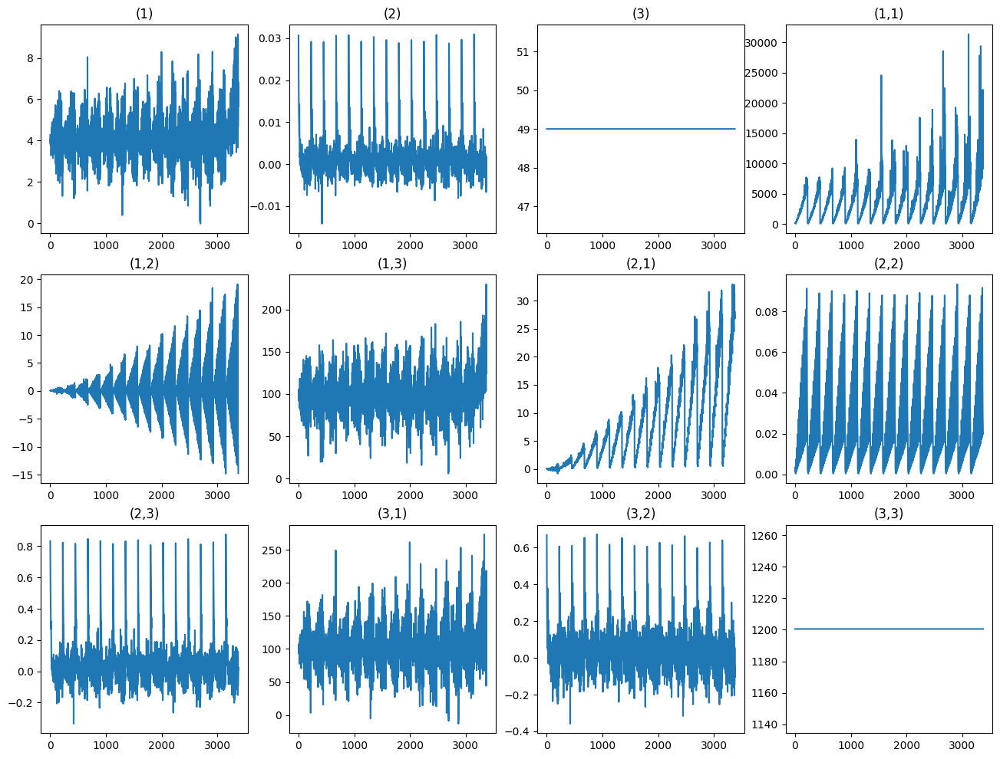

In [34]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4))
axs = axs.ravel()
for i, ax in enumerate(axs):
    ax.title.set_text(sig_keys.split()[i+1])
    ax.plot(Exp_signatures_results_rhos_and_thetas_kappas.T[i])

In [35]:
def signatures_calculations_3_parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths):
    count=0
    for rho in by_parameter_3["by_rhos"]:
              for kappa in by_parameter_3["by_kappas"]:
                  for theta in by_parameter_3["by_thetas"]:
                        # Caclulation of 10000 paths of prices and sigmas
                        prices_1, sigs_1 = generate_heston_paths(S, T, r, kappa, theta, theta, rho, sigma, steps, paths,
                                                                 return_vol=True)
                        for j in range(paths):
                            prices_and_sigs_with_time_tensor[j] = torch.tensor([prices_1[j], sigs_1[j], time_array]).T
                        #     shape of prices_and_sigs_witout_time_tensor=torch.Size([10000, 100, 3])

                        sign_ps_signatory_differentranges[count] = signatory.signature(prices_and_sigs_with_time_tensor, depth_of_sig)
                        #     shape of  sign_ps_signatory_differentranges=torch.Size([512, 10000, 12])

                        Exp_sign_signatory_results[count] = torch.mean(sign_ps_signatory_differentranges[count], axis=0)
                        #     shape of  Exp_sign_signatory_results=torch.Size([512, 12])

                        count = count + 1
    return sign_ps_signatory_differentranges,Exp_sign_signatory_results

In [36]:
results_rhos_and_kappas_thetas=signatures_calculations_3_parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths)
signatures_results_rhos_and_kappas_thetas=results_rhos_and_kappas_thetas[0]
Exp_signatures_results_rhos_and_kappas_thetas=results_rhos_and_kappas_thetas[1]

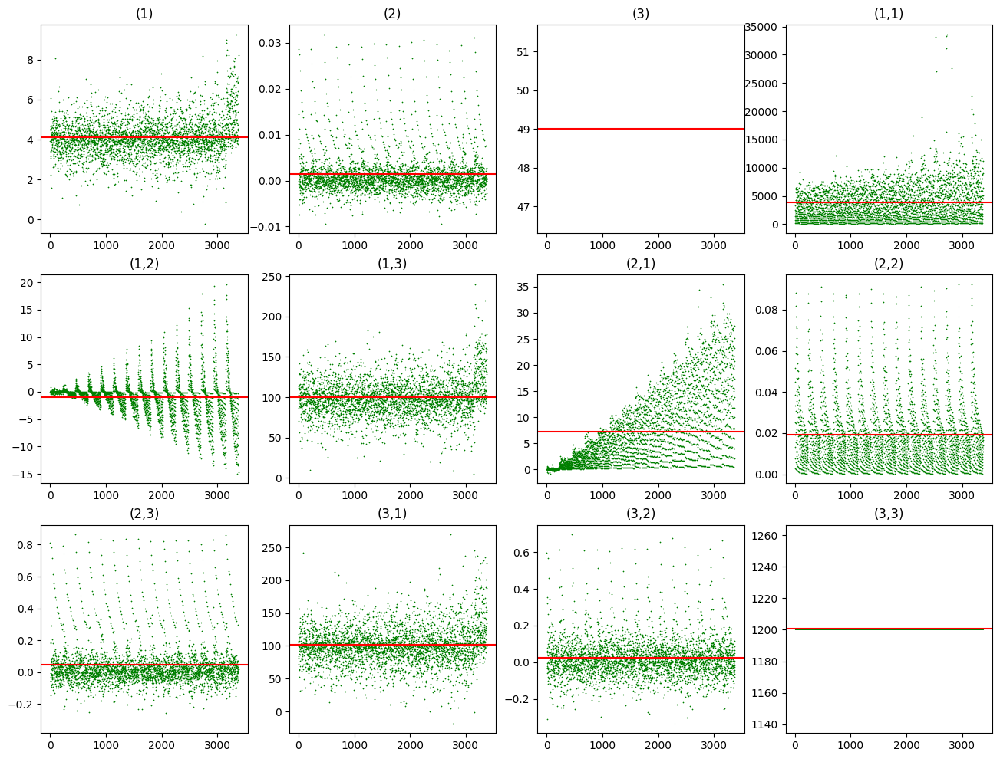

In [40]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4))
axs = axs.ravel()
for i, ax in enumerate(axs):
    ax.title.set_text(sig_keys.split()[i+1])
    ax.scatter(range(1,3376),Exp_signatures_results_rhos_and_kappas_thetas.T[i], color='green', linewidth=0.15, s=1, alpha=1)
    ax.axhline(torch.mean(Exp_signatures_results_rhos_and_kappas_thetas.T[i]), color='red')

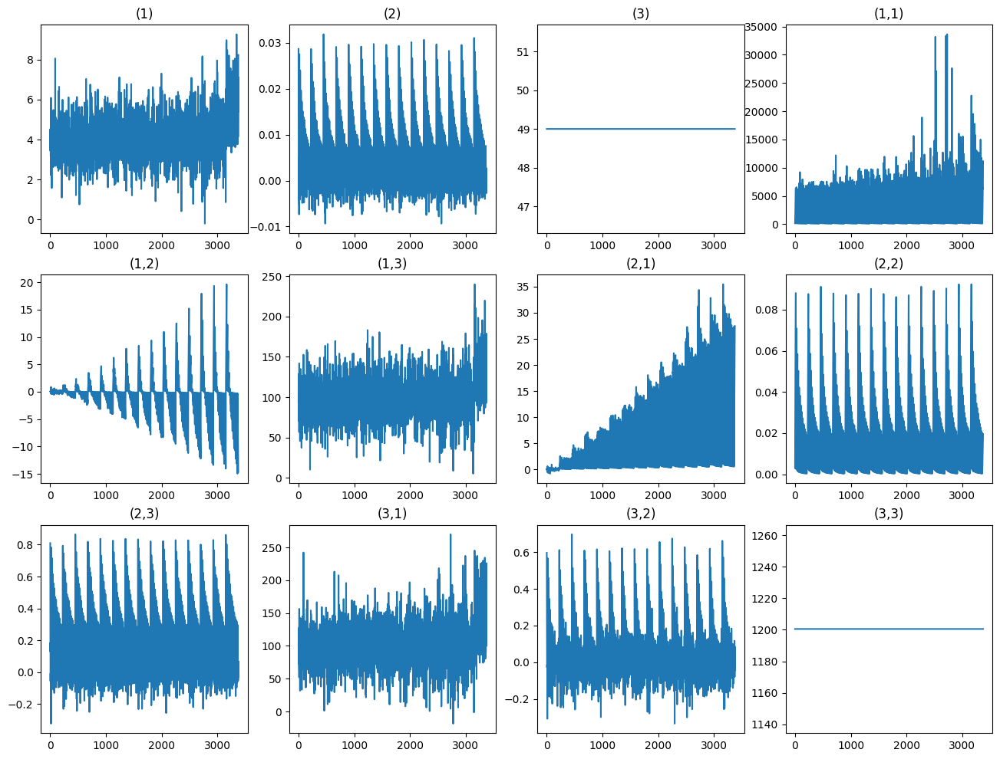

In [41]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4))
axs = axs.ravel()
for i, ax in enumerate(axs):
    ax.title.set_text(sig_keys.split()[i+1])
    ax.plot(Exp_signatures_results_rhos_and_thetas_kappas.T[i])

In [42]:
def signatures_calculations_3_parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths):
    count=0
    for kappa in by_parameter_3["by_kappas"]:
              for rho in by_parameter_3["by_rhos"]:
                  for theta in by_parameter_3["by_thetas"]:
                        # Caclulation of 10000 paths of prices and sigmas
                        prices_1, sigs_1 = generate_heston_paths(S, T, r, kappa, theta, theta, rho, sigma, steps, paths,
                                                                 return_vol=True)
                        for j in range(paths):
                            prices_and_sigs_with_time_tensor[j] = torch.tensor([prices_1[j], sigs_1[j], time_array]).T
                        #     shape of prices_and_sigs_witout_time_tensor=torch.Size([10000, 100, 3])

                        sign_ps_signatory_differentranges[count] = signatory.signature(prices_and_sigs_with_time_tensor, depth_of_sig)
                        #     shape of  sign_ps_signatory_differentranges=torch.Size([512, 10000, 12])

                        Exp_sign_signatory_results[count] = torch.mean(sign_ps_signatory_differentranges[count], axis=0)
                        #     shape of  Exp_sign_signatory_results=torch.Size([512, 12])

                        count = count + 1
    return sign_ps_signatory_differentranges,Exp_sign_signatory_results

In [43]:
results_kappas_and_rhos_thetas=signatures_calculations_3_parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths)
signatures_results_kappas_and_rhos_thetas=results_kappas_and_rhos_thetas[0]
Exp_signatures_results_kappas_and_rhos_thetas=results_kappas_and_rhos_thetas[1]

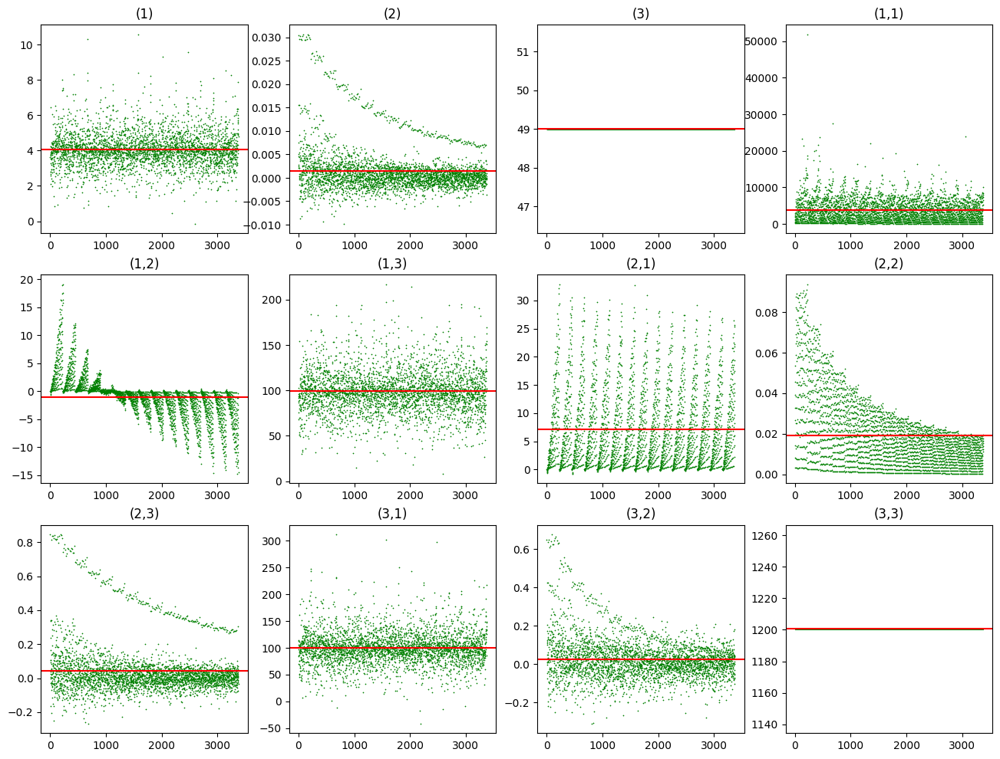

In [44]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4))
axs = axs.ravel()
for i, ax in enumerate(axs):
    ax.title.set_text(sig_keys.split()[i+1])
    ax.scatter(range(1,3376),Exp_signatures_results_kappas_and_rhos_thetas.T[i], color='green', linewidth=0.15, s=1, alpha=1)
    ax.axhline(torch.mean(Exp_signatures_results_kappas_and_rhos_thetas.T[i]), color='red')

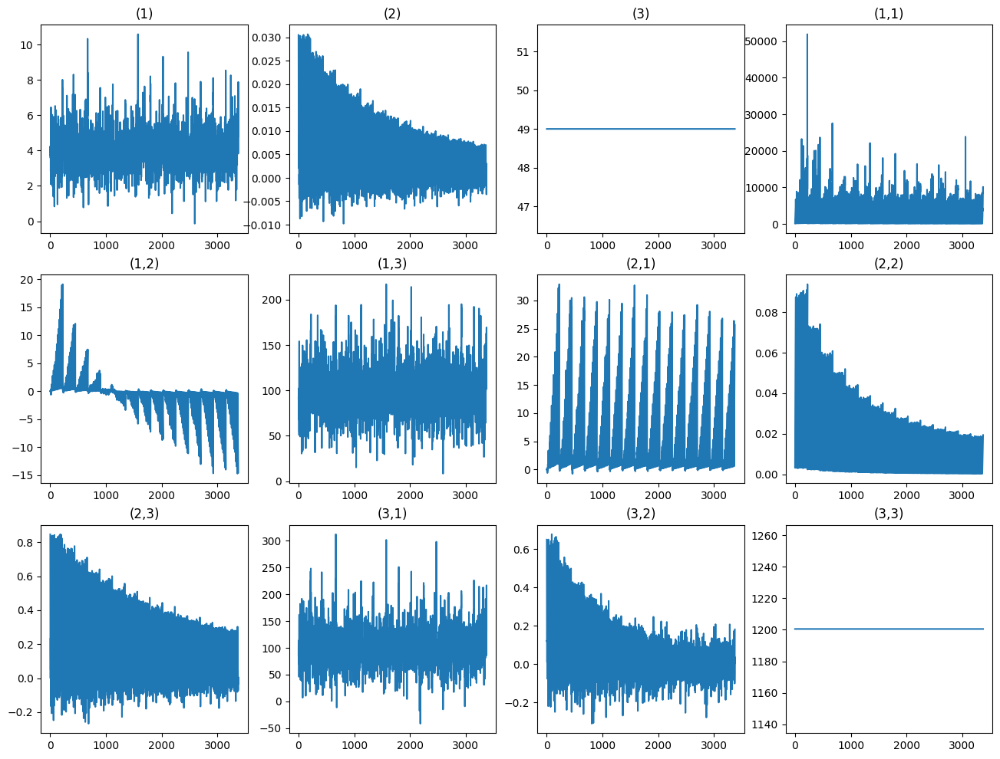

In [45]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4))
axs = axs.ravel()
for i, ax in enumerate(axs):
    ax.title.set_text(sig_keys.split()[i+1])
    ax.plot(Exp_signatures_results_kappas_and_rhos_thetas.T[i])

In [48]:
def signatures_calculations_3_parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths):
    count=0
    for kappa in by_parameter_3["by_kappas"]:
              for theta in by_parameter_3["by_thetas"]:
                  for rho in by_parameter_3["by_rhos"]:
                        # Caclulation of 10000 paths of prices and sigmas
                        prices_1, sigs_1 = generate_heston_paths(S, T, r, kappa, theta, theta, rho, sigma, steps, paths,
                                                                 return_vol=True)
                        for j in range(paths):
                            prices_and_sigs_with_time_tensor[j] = torch.tensor([prices_1[j], sigs_1[j], time_array]).T
                        #     shape of prices_and_sigs_witout_time_tensor=torch.Size([10000, 100, 3])

                        sign_ps_signatory_differentranges[count] = signatory.signature(prices_and_sigs_with_time_tensor, depth_of_sig)
                        #     shape of  sign_ps_signatory_differentranges=torch.Size([512, 10000, 12])

                        Exp_sign_signatory_results[count] = torch.mean(sign_ps_signatory_differentranges[count], axis=0)
                        #     shape of  Exp_sign_signatory_results=torch.Size([512, 12])

                        count = count + 1
    return sign_ps_signatory_differentranges,Exp_sign_signatory_results

In [49]:
results_kappas_and_thetas_rhos=signatures_calculations_3_parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths)
signatures_results_kappas_and_thetas_rhos=results_kappas_and_thetas_rhos[0]
Exp_signatures_results_kappas_and_thetas_rhos=results_kappas_and_thetas_rhos[1]

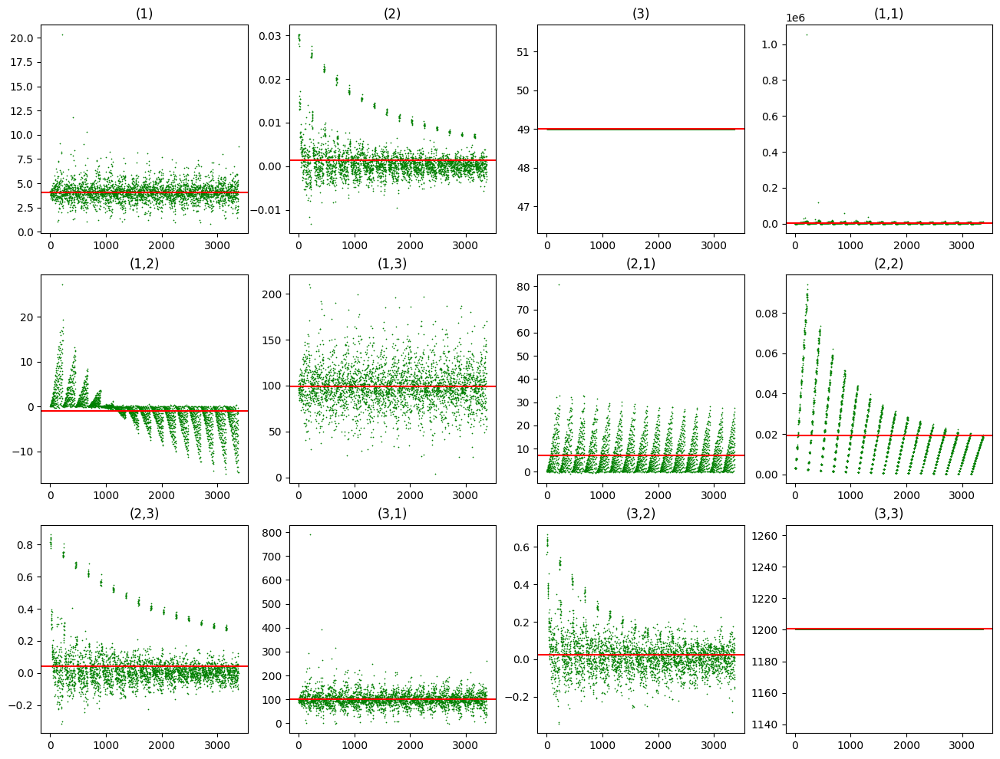

In [50]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4))
axs = axs.ravel()
for i, ax in enumerate(axs):
    ax.title.set_text(sig_keys.split()[i+1])
    ax.scatter(range(1,3376),Exp_signatures_results_kappas_and_thetas_rhos.T[i], color='green', linewidth=0.15, s=1, alpha=1)
    ax.axhline(torch.mean(Exp_signatures_results_kappas_and_thetas_rhos.T[i]), color='red')

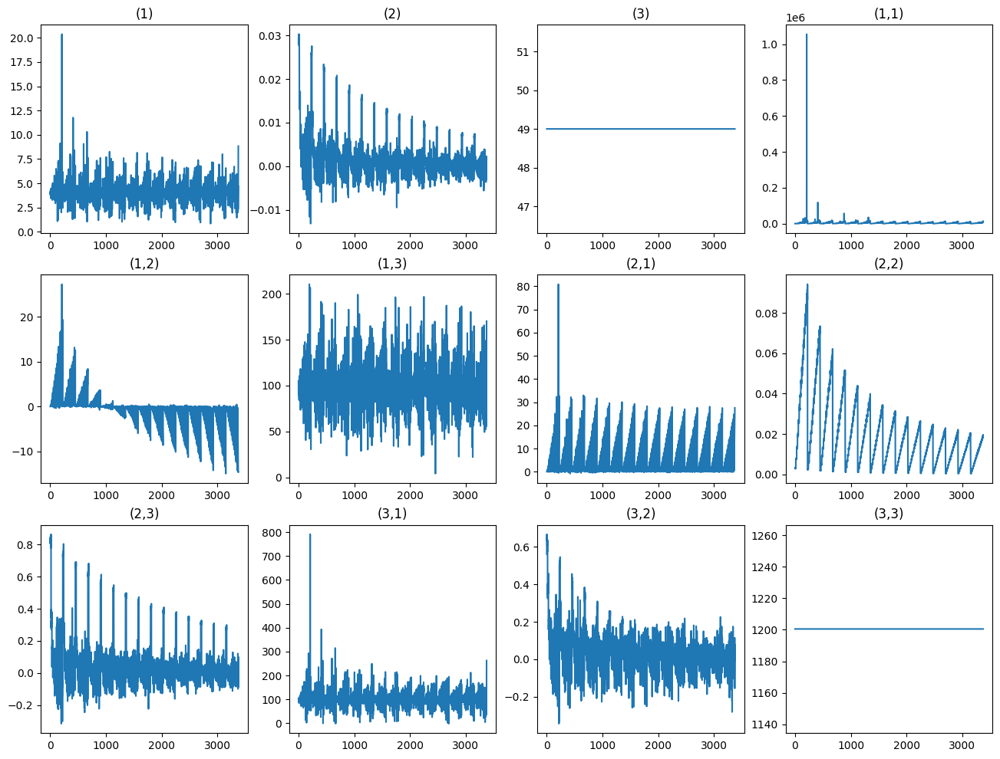

In [51]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4))
axs = axs.ravel()
for i, ax in enumerate(axs):
    ax.title.set_text(sig_keys.split()[i+1])
    ax.plot(Exp_signatures_results_kappas_and_thetas_rhos.T[i])

In [52]:
def signatures_calculations_3_parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths):
    count=0
    for theta in by_parameter_3["by_thetas"]:
              for kappa in by_parameter_3["by_kappas"]:
                  for rho in by_parameter_3["by_rhos"]:
                        # Caclulation of 10000 paths of prices and sigmas
                        prices_1, sigs_1 = generate_heston_paths(S, T, r, kappa, theta, theta, rho, sigma, steps, paths,
                                                                 return_vol=True)
                        for j in range(paths):
                            prices_and_sigs_with_time_tensor[j] = torch.tensor([prices_1[j], sigs_1[j], time_array]).T
                        #     shape of prices_and_sigs_witout_time_tensor=torch.Size([10000, 100, 3])

                        sign_ps_signatory_differentranges[count] = signatory.signature(prices_and_sigs_with_time_tensor, depth_of_sig)
                        #     shape of  sign_ps_signatory_differentranges=torch.Size([512, 10000, 12])

                        Exp_sign_signatory_results[count] = torch.mean(sign_ps_signatory_differentranges[count], axis=0)
                        #     shape of  Exp_sign_signatory_results=torch.Size([512, 12])

                        count = count + 1
    return sign_ps_signatory_differentranges,Exp_sign_signatory_results

In [53]:
results_thetas_and_kappas_rhos=signatures_calculations_3_parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths)
signatures_results_thetas_and_kappas_rhos=results_thetas_and_kappas_rhos[0]
Exp_signatures_results_thetas_and_kappas_rhos=results_thetas_and_kappas_rhos[1]

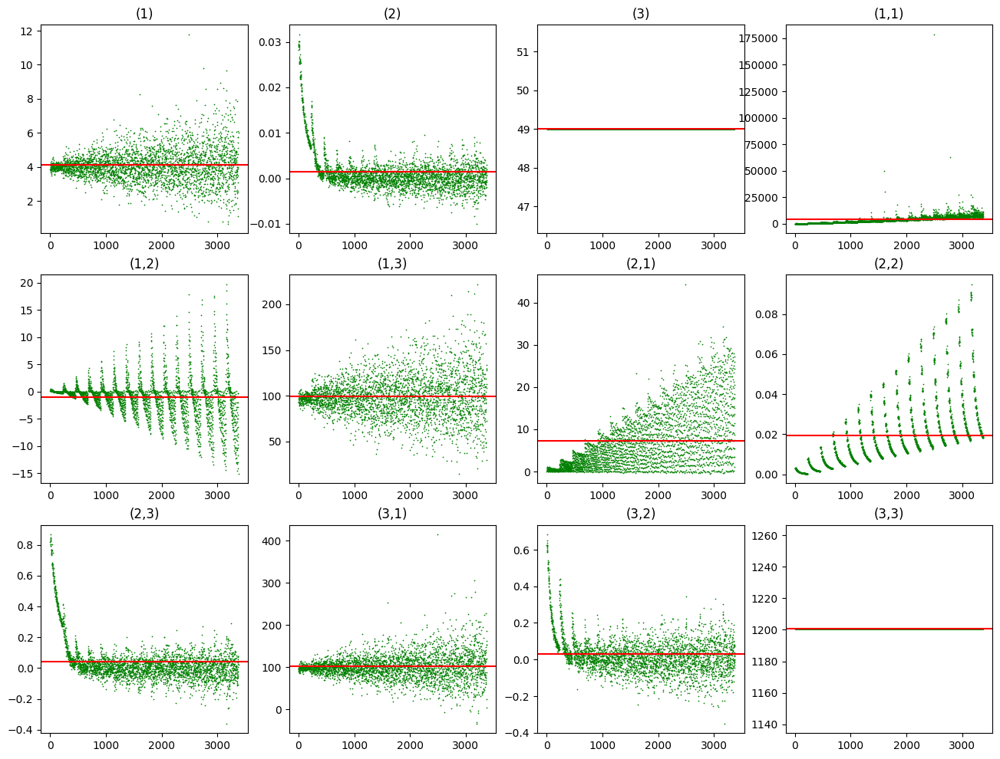

In [54]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4))
axs = axs.ravel()
for i, ax in enumerate(axs):
    ax.title.set_text(sig_keys.split()[i+1])
    ax.scatter(range(1,3376),Exp_signatures_results_thetas_and_kappas_rhos.T[i], color='green', linewidth=0.15, s=1, alpha=1)
    ax.axhline(torch.mean(Exp_signatures_results_thetas_and_kappas_rhos.T[i]), color='red')

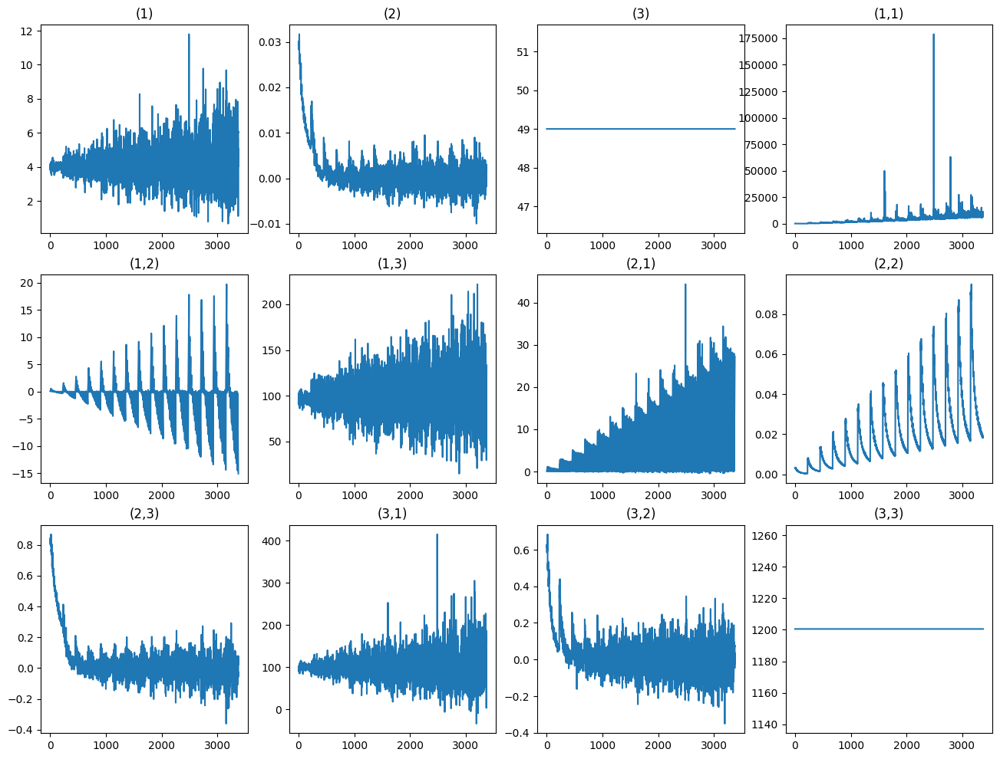

In [55]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4))
axs = axs.ravel()
for i, ax in enumerate(axs):
    ax.title.set_text(sig_keys.split()[i+1])
    ax.plot(Exp_signatures_results_thetas_and_kappas_rhos.T[i])

In [56]:
def signatures_calculations_3_parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths):
    count=0
    for theta in by_parameter_3["by_thetas"]:
              for rho in by_parameter_3["by_rhos"]:
                  for kappa in by_parameter_3["by_kappas"]:
                        # Caclulation of 10000 paths of prices and sigmas
                        prices_1, sigs_1 = generate_heston_paths(S, T, r, kappa, theta, theta, rho, sigma, steps, paths,
                                                                 return_vol=True)
                        for j in range(paths):
                            prices_and_sigs_with_time_tensor[j] = torch.tensor([prices_1[j], sigs_1[j], time_array]).T
                        #     shape of prices_and_sigs_witout_time_tensor=torch.Size([10000, 100, 3])

                        sign_ps_signatory_differentranges[count] = signatory.signature(prices_and_sigs_with_time_tensor, depth_of_sig)
                        #     shape of  sign_ps_signatory_differentranges=torch.Size([512, 10000, 12])

                        Exp_sign_signatory_results[count] = torch.mean(sign_ps_signatory_differentranges[count], axis=0)
                        #     shape of  Exp_sign_signatory_results=torch.Size([512, 12])

                        count = count + 1
    return sign_ps_signatory_differentranges,Exp_sign_signatory_results

In [57]:
results_thetas_and_rhos_kappas=signatures_calculations_3_parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths)
signatures_results_thetas_and_rhos_kappas=results_thetas_and_rhos_kappas[0]
Exp_signatures_results_thetas_and_rhos_kappas=results_thetas_and_rhos_kappas[1]

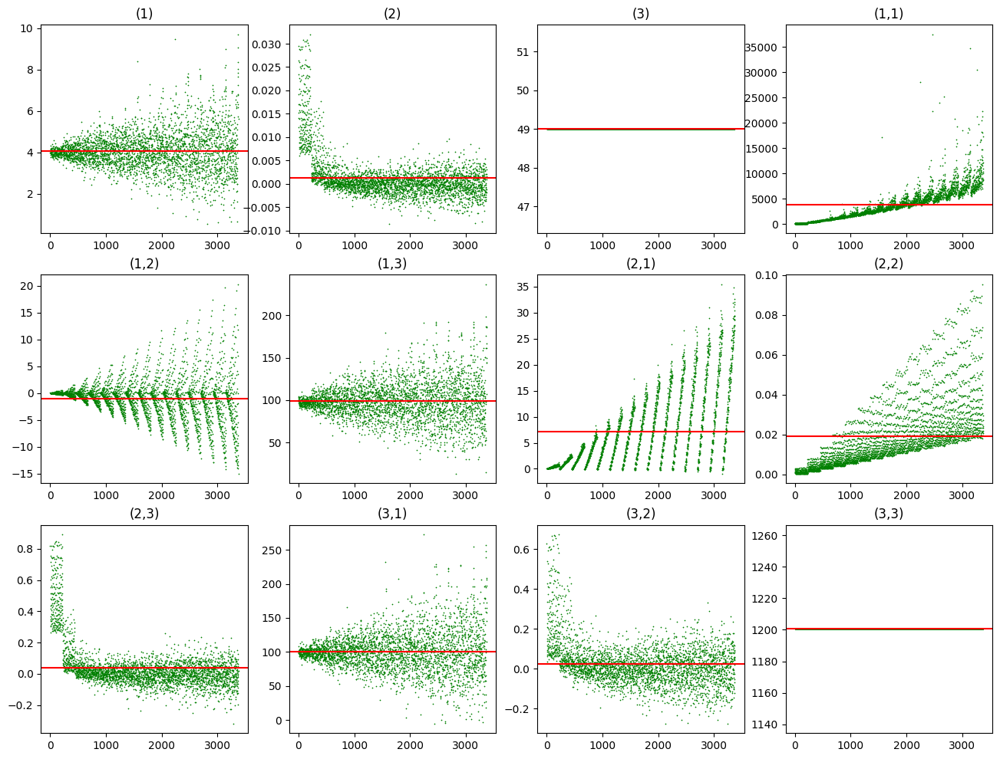

In [58]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4))
axs = axs.ravel()
for i, ax in enumerate(axs):
    ax.title.set_text(sig_keys.split()[i+1])
    ax.scatter(range(1,3376),Exp_signatures_results_thetas_and_rhos_kappas.T[i], color='green', linewidth=0.15, s=1, alpha=1)
    ax.axhline(torch.mean(Exp_signatures_results_thetas_and_rhos_kappas.T[i]), color='red')

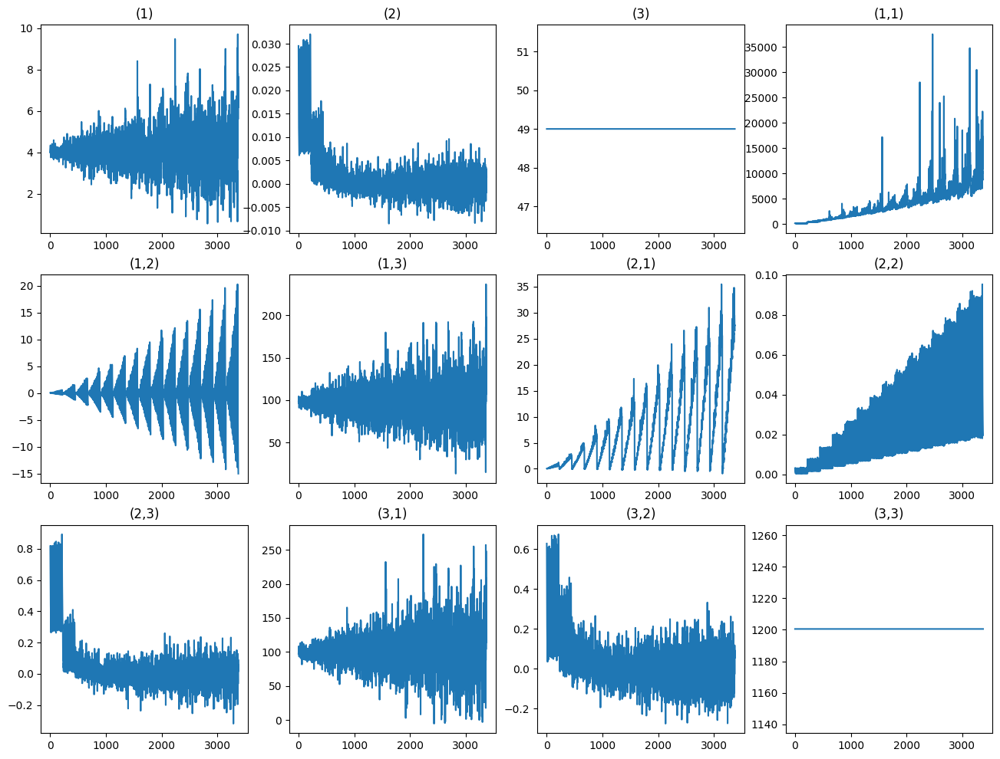

In [59]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4))
axs = axs.ravel()
for i, ax in enumerate(axs):
    ax.title.set_text(sig_keys.split()[i+1])
    ax.plot(Exp_signatures_results_thetas_and_rhos_kappas.T[i])

In [60]:
number_of_loops=by_parameter_3["by_sigmas"].shape[0]*by_parameter_3["by_thetas"].shape[0]*by_parameter_3["by_rhos"].shape[0]
sign_ps_signatory_differentranges=torch.zeros((number_of_loops,paths,sig_dim))
Exp_sign_signatory_results=torch.zeros((number_of_loops,sig_dim))
# sign_ps_signatory_differentranges[0].shape

In [61]:
def signatures_calculations_3_parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths):
    count=0
    for theta in by_parameter_3["by_thetas"]:
              for rho in by_parameter_3["by_rhos"]:
                  for sigma in by_parameter_3["by_sigmas"]:
                        # Caclulation of 10000 paths of prices and sigmas
                        prices_1, sigs_1 = generate_heston_paths(S, T, r, kappa, theta, theta, rho, sigma, steps, paths,
                                                                 return_vol=True)
                        for j in range(paths):
                            prices_and_sigs_with_time_tensor[j] = torch.tensor([prices_1[j], sigs_1[j], time_array]).T
                        #     shape of prices_and_sigs_witout_time_tensor=torch.Size([10000, 100, 3])

                        sign_ps_signatory_differentranges[count] = signatory.signature(prices_and_sigs_with_time_tensor, depth_of_sig)
                        #     shape of  sign_ps_signatory_differentranges=torch.Size([512, 10000, 12])

                        Exp_sign_signatory_results[count] = torch.mean(sign_ps_signatory_differentranges[count], axis=0)
                        #     shape of  Exp_sign_signatory_results=torch.Size([512, 12])

                        count = count + 1
    return sign_ps_signatory_differentranges,Exp_sign_signatory_results

In [62]:
results_thetas_and_rhos_sigmas=signatures_calculations_3_parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths)
signatures_results_thetas_and_rhos_sigmas=results_thetas_and_rhos_sigmas[0]
Exp_signatures_results_thetas_and_rhos_sigmas=results_thetas_and_rhos_sigmas[1]

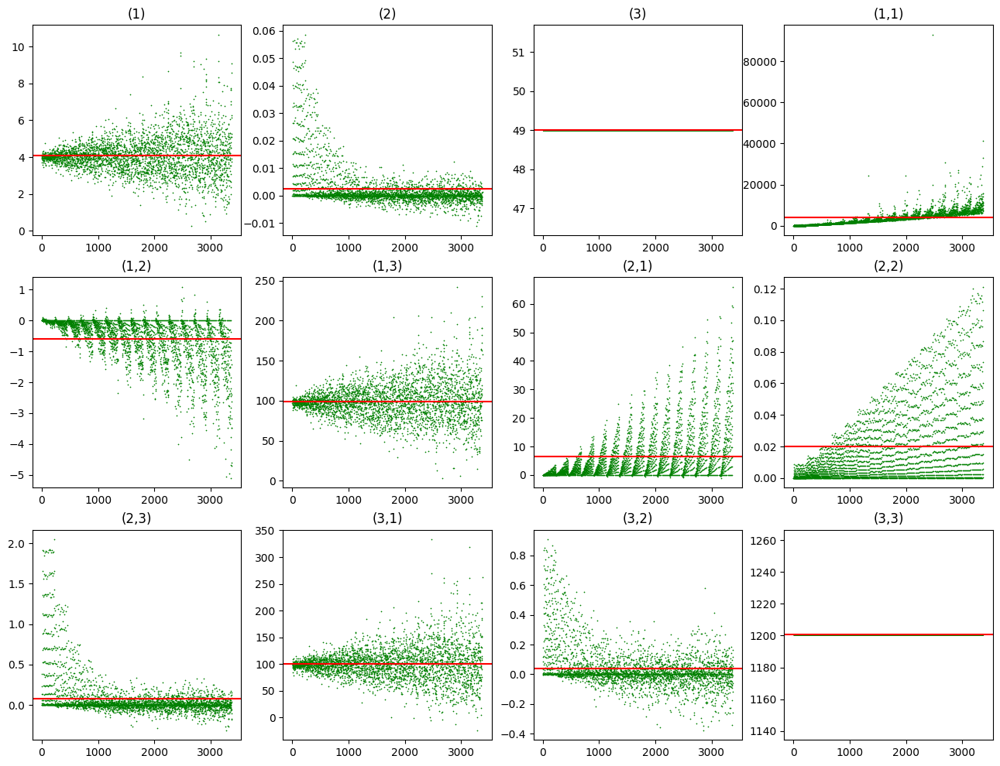

In [63]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4))
axs = axs.ravel()
for i, ax in enumerate(axs):
    ax.title.set_text(sig_keys.split()[i+1])
    ax.scatter(range(1,3376),Exp_signatures_results_thetas_and_rhos_sigmas.T[i], color='green', linewidth=0.15, s=1, alpha=1)
    ax.axhline(torch.mean(Exp_signatures_results_thetas_and_rhos_sigmas.T[i]), color='red')

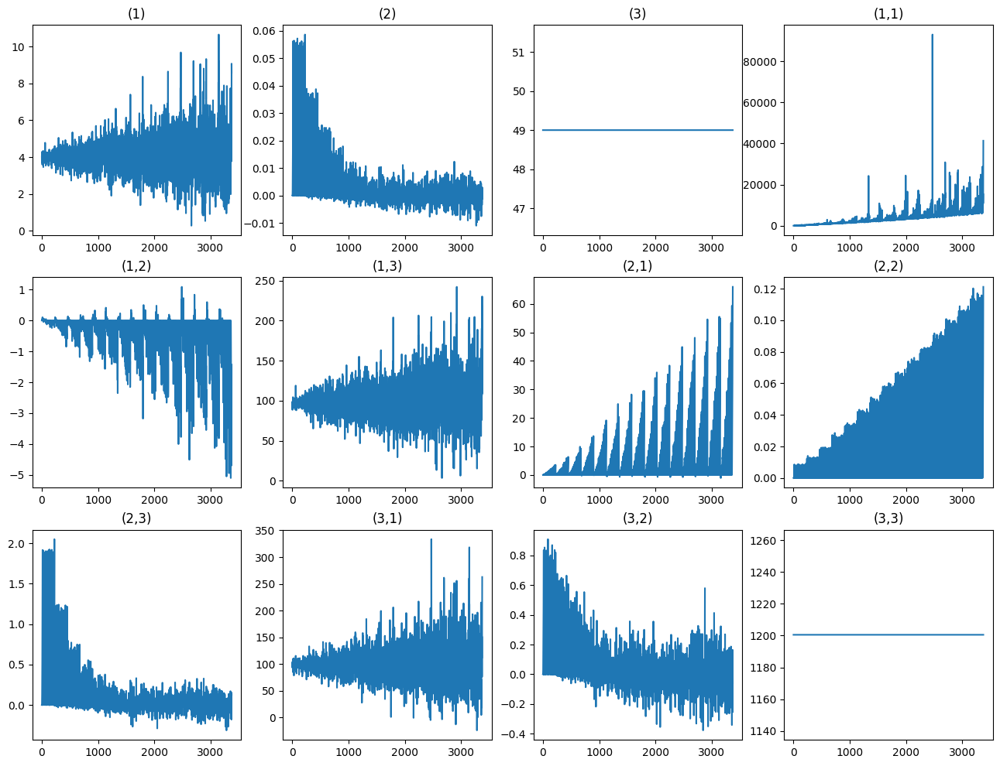

In [64]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4))
axs = axs.ravel()
for i, ax in enumerate(axs):
    ax.title.set_text(sig_keys.split()[i+1])
    ax.plot(Exp_signatures_results_thetas_and_rhos_sigmas.T[i])

In [65]:
def signatures_calculations_3_parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths):
    count=0
    for theta in by_parameter_3["by_thetas"]:
              for sigma in by_parameter_3["by_sigmas"]:
                  for rho in by_parameter_3["by_rhos"]:
                        # Caclulation of 10000 paths of prices and sigmas
                        prices_1, sigs_1 = generate_heston_paths(S, T, r, kappa, theta, theta, rho, sigma, steps, paths,
                                                                 return_vol=True)
                        for j in range(paths):
                            prices_and_sigs_with_time_tensor[j] = torch.tensor([prices_1[j], sigs_1[j], time_array]).T
                        #     shape of prices_and_sigs_witout_time_tensor=torch.Size([10000, 100, 3])

                        sign_ps_signatory_differentranges[count] = signatory.signature(prices_and_sigs_with_time_tensor, depth_of_sig)
                        #     shape of  sign_ps_signatory_differentranges=torch.Size([512, 10000, 12])

                        Exp_sign_signatory_results[count] = torch.mean(sign_ps_signatory_differentranges[count], axis=0)
                        #     shape of  Exp_sign_signatory_results=torch.Size([512, 12])

                        count = count + 1
    return sign_ps_signatory_differentranges,Exp_sign_signatory_results

In [66]:
results_thetas_and_sigmas_rhos=signatures_calculations_3_parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths)
signatures_results_thetas_and_sigmas_rhos=results_thetas_and_sigmas_rhos[0]
Exp_signatures_results_thetas_and_sigmas_rhos=results_thetas_and_sigmas_rhos[1]

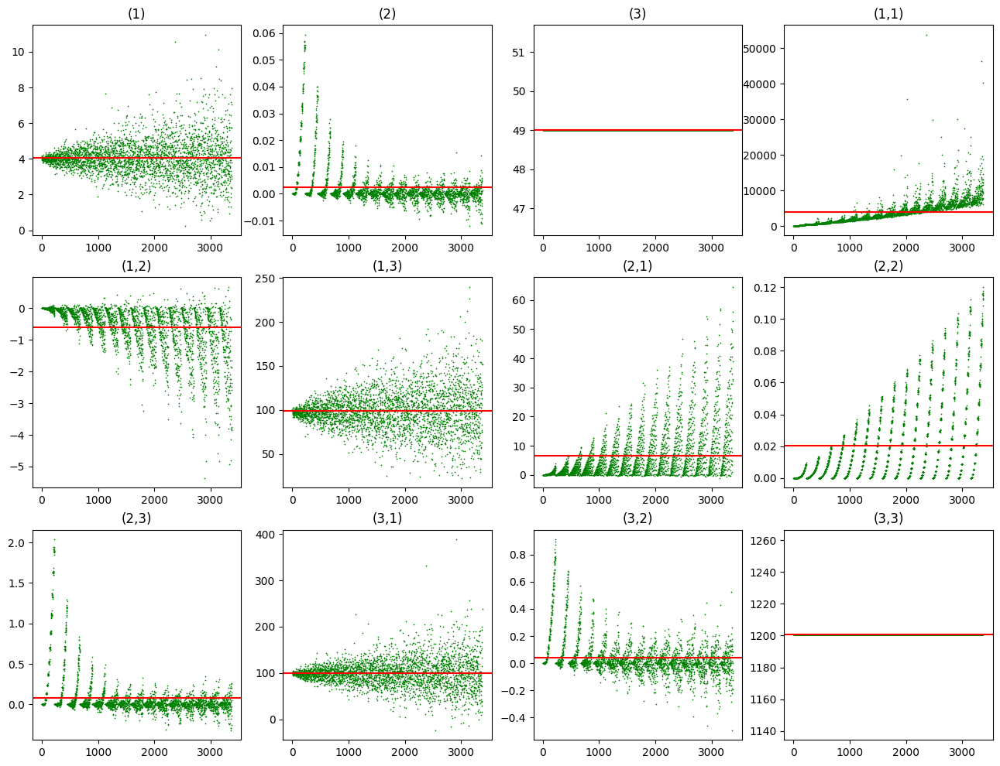

In [67]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4))
axs = axs.ravel()
for i, ax in enumerate(axs):
    ax.title.set_text(sig_keys.split()[i+1])
    ax.scatter(range(1,3376),Exp_signatures_results_thetas_and_sigmas_rhos.T[i], color='green', linewidth=0.15, s=1, alpha=1)
    ax.axhline(torch.mean(Exp_signatures_results_thetas_and_sigmas_rhos.T[i]), color='red')

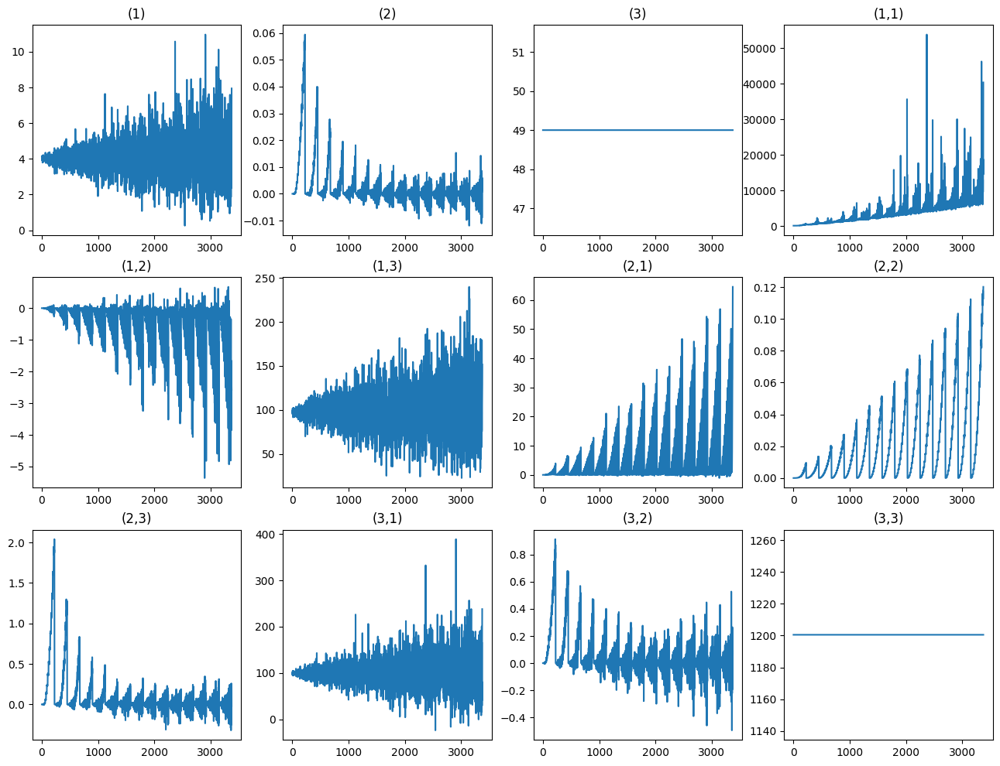

In [68]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4))
axs = axs.ravel()
for i, ax in enumerate(axs):
    ax.title.set_text(sig_keys.split()[i+1])
    ax.plot(Exp_signatures_results_thetas_and_sigmas_rhos.T[i])

In [69]:
def signatures_calculations_3_parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths):
    count=0
    for sigma in by_parameter_3["by_sigmas"]:
              for theta in by_parameter_3["by_thetas"]:
                  for rho in by_parameter_3["by_rhos"]:
                        # Caclulation of 10000 paths of prices and sigmas
                        prices_1, sigs_1 = generate_heston_paths(S, T, r, kappa, theta, theta, rho, sigma, steps, paths,
                                                                 return_vol=True)
                        for j in range(paths):
                            prices_and_sigs_with_time_tensor[j] = torch.tensor([prices_1[j], sigs_1[j], time_array]).T
                        #     shape of prices_and_sigs_witout_time_tensor=torch.Size([10000, 100, 3])

                        sign_ps_signatory_differentranges[count] = signatory.signature(prices_and_sigs_with_time_tensor, depth_of_sig)
                        #     shape of  sign_ps_signatory_differentranges=torch.Size([512, 10000, 12])

                        Exp_sign_signatory_results[count] = torch.mean(sign_ps_signatory_differentranges[count], axis=0)
                        #     shape of  Exp_sign_signatory_results=torch.Size([512, 12])

                        count = count + 1
    return sign_ps_signatory_differentranges,Exp_sign_signatory_results

In [70]:
results_sigmas_and_thetas_rhos=signatures_calculations_3_parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths)
signatures_results_sigmas_and_thetas_rhos=results_sigmas_and_thetas_rhos[0]
Exp_signatures_results_sigmas_and_thetas_rhos=results_sigmas_and_thetas_rhos[1]

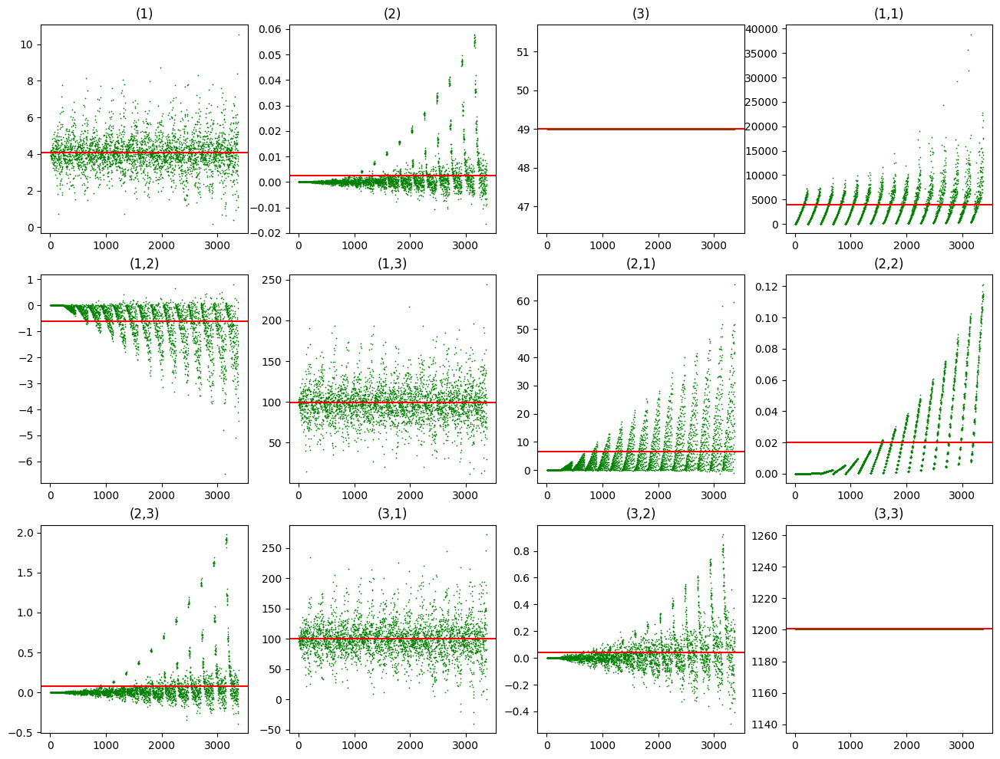

In [71]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4))
axs = axs.ravel()
for i, ax in enumerate(axs):
    ax.title.set_text(sig_keys.split()[i+1])
    ax.scatter(range(1,3376),Exp_signatures_results_sigmas_and_thetas_rhos.T[i], color='green', linewidth=0.15, s=1, alpha=1)
    ax.axhline(torch.mean(Exp_signatures_results_sigmas_and_thetas_rhos.T[i]), color='red')

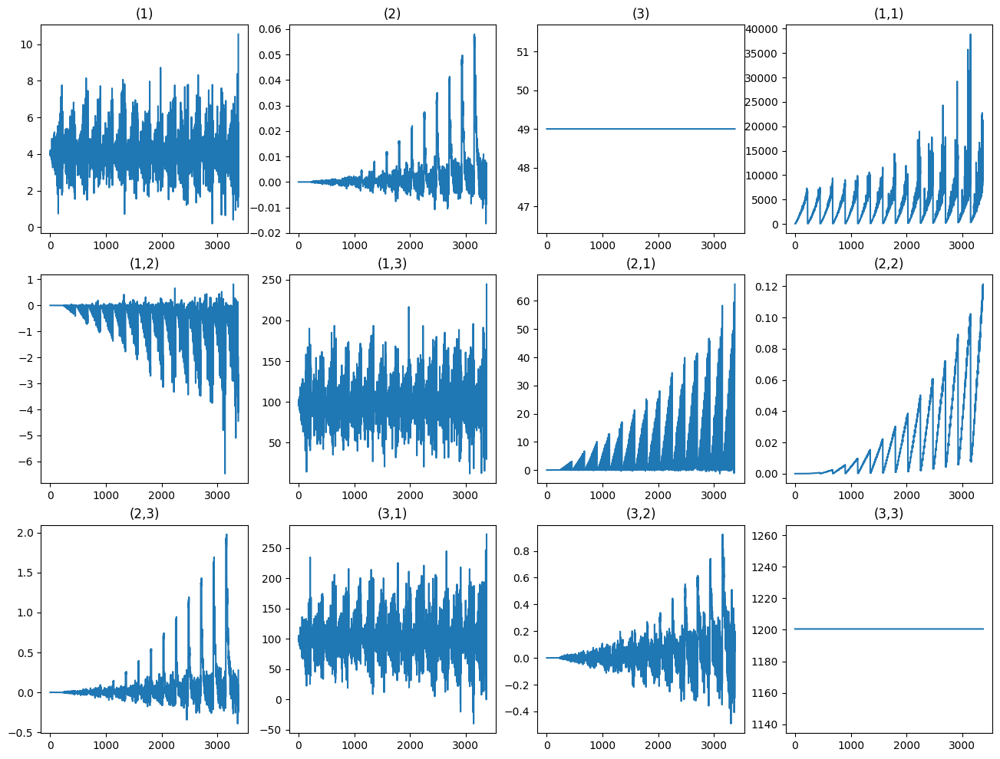

In [72]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4))
axs = axs.ravel()
for i, ax in enumerate(axs):
    ax.title.set_text(sig_keys.split()[i+1])
    ax.plot(Exp_signatures_results_sigmas_and_thetas_rhos.T[i])

In [73]:
def signatures_calculations_3_parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths):
    count=0
    for sigma in by_parameter_3["by_sigmas"]:
              for rho in by_parameter_3["by_rhos"]:
                  for theta in by_parameter_3["by_thetas"]:
                        # Caclulation of 10000 paths of prices and sigmas
                        prices_1, sigs_1 = generate_heston_paths(S, T, r, kappa, theta, theta, rho, sigma, steps, paths,
                                                                 return_vol=True)
                        for j in range(paths):
                            prices_and_sigs_with_time_tensor[j] = torch.tensor([prices_1[j], sigs_1[j], time_array]).T
                        #     shape of prices_and_sigs_witout_time_tensor=torch.Size([10000, 100, 3])

                        sign_ps_signatory_differentranges[count] = signatory.signature(prices_and_sigs_with_time_tensor, depth_of_sig)
                        #     shape of  sign_ps_signatory_differentranges=torch.Size([512, 10000, 12])

                        Exp_sign_signatory_results[count] = torch.mean(sign_ps_signatory_differentranges[count], axis=0)
                        #     shape of  Exp_sign_signatory_results=torch.Size([512, 12])

                        count = count + 1
    return sign_ps_signatory_differentranges,Exp_sign_signatory_results

In [74]:
results_sigmas_and_rhos_thetas=signatures_calculations_3_parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths)
signatures_results_sigmas_and_rhos_thetas=results_sigmas_and_rhos_thetas[0]
Exp_signatures_results_sigmas_and_rhos_thetas=results_sigmas_and_rhos_thetas[1]

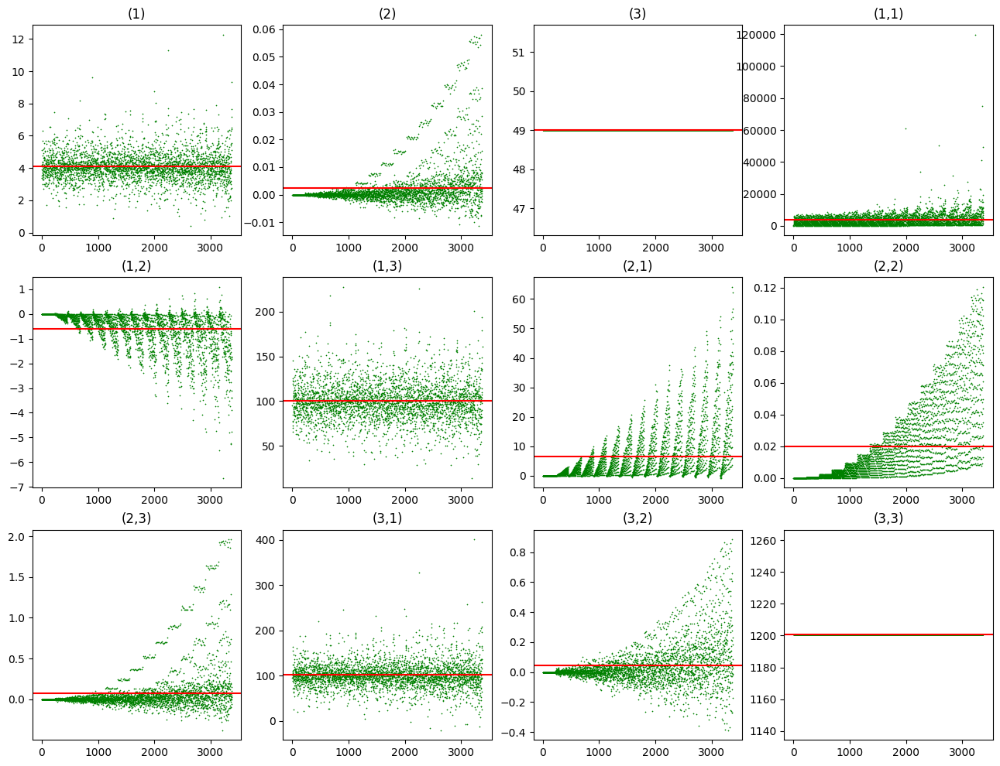

In [75]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4))
axs = axs.ravel()
for i, ax in enumerate(axs):
    ax.title.set_text(sig_keys.split()[i+1])
    ax.scatter(range(1,3376),Exp_signatures_results_sigmas_and_rhos_thetas.T[i], color='green', linewidth=0.15, s=1, alpha=1)
    ax.axhline(torch.mean(Exp_signatures_results_sigmas_and_rhos_thetas.T[i]), color='red')

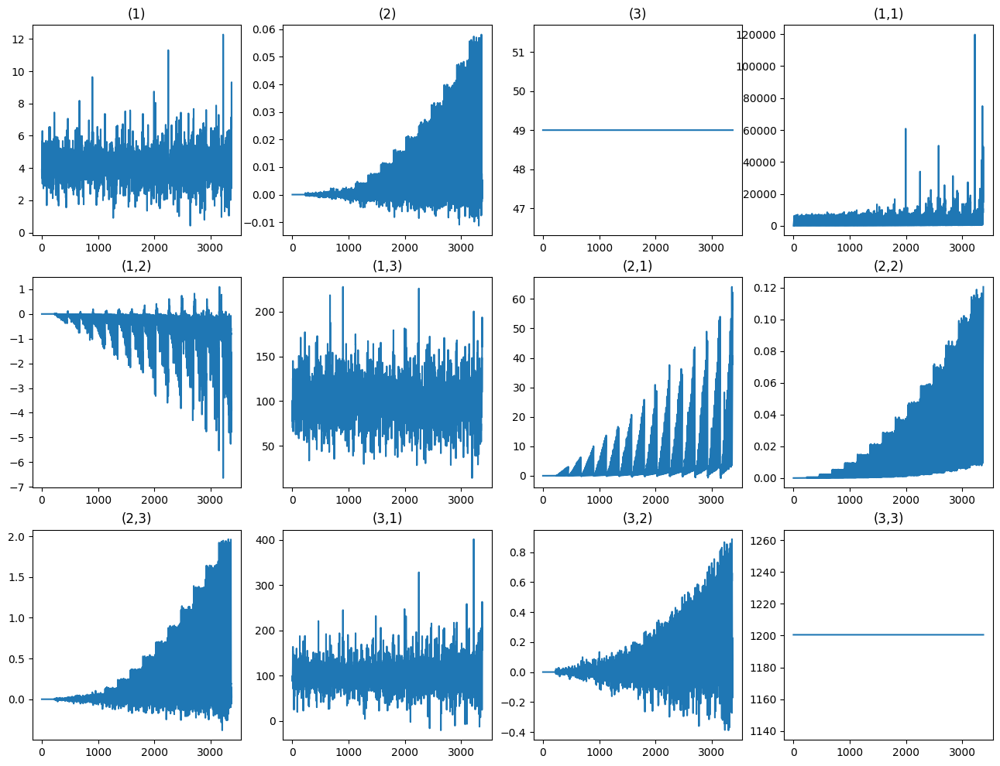

In [76]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4))
axs = axs.ravel()
for i, ax in enumerate(axs):
    ax.title.set_text(sig_keys.split()[i+1])
    ax.plot(Exp_signatures_results_sigmas_and_rhos_thetas.T[i])

In [77]:
def signatures_calculations_3_parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths):
    count=0
    for rho in by_parameter_3["by_rhos"]:
              for sigma in by_parameter_3["by_sigmas"]:
                  for theta in by_parameter_3["by_thetas"]:
                        # Caclulation of 10000 paths of prices and sigmas
                        prices_1, sigs_1 = generate_heston_paths(S, T, r, kappa, theta, theta, rho, sigma, steps, paths,
                                                                 return_vol=True)
                        for j in range(paths):
                            prices_and_sigs_with_time_tensor[j] = torch.tensor([prices_1[j], sigs_1[j], time_array]).T
                        #     shape of prices_and_sigs_witout_time_tensor=torch.Size([10000, 100, 3])

                        sign_ps_signatory_differentranges[count] = signatory.signature(prices_and_sigs_with_time_tensor, depth_of_sig)
                        #     shape of  sign_ps_signatory_differentranges=torch.Size([512, 10000, 12])

                        Exp_sign_signatory_results[count] = torch.mean(sign_ps_signatory_differentranges[count], axis=0)
                        #     shape of  Exp_sign_signatory_results=torch.Size([512, 12])

                        count = count + 1
    return sign_ps_signatory_differentranges,Exp_sign_signatory_results

In [78]:
results_rhos_and_sigmas_thetas=signatures_calculations_3_parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths)
signatures_results_rhos_and_sigmas_thetas=results_rhos_and_sigmas_thetas[0]
Exp_signatures_results_rhos_and_sigmas_thetas=results_rhos_and_sigmas_thetas[1]

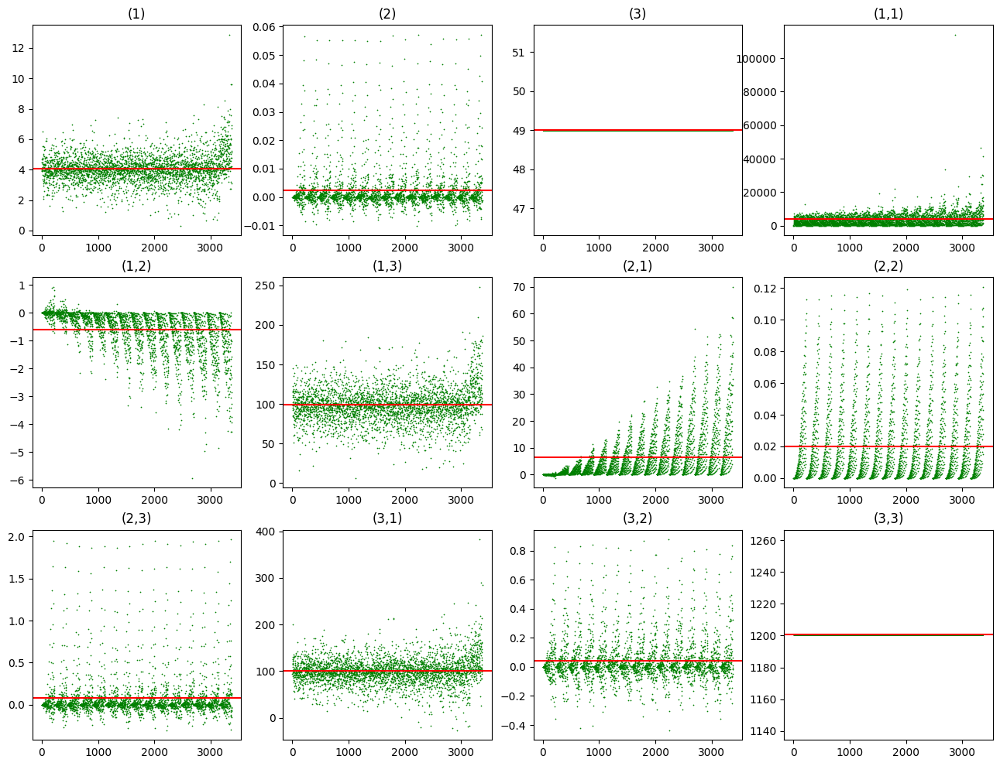

In [79]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4))
axs = axs.ravel()
for i, ax in enumerate(axs):
    ax.title.set_text(sig_keys.split()[i+1])
    ax.scatter(range(1,3376),Exp_signatures_results_rhos_and_sigmas_thetas.T[i], color='green', linewidth=0.15, s=1, alpha=1)
    ax.axhline(torch.mean(Exp_signatures_results_rhos_and_sigmas_thetas.T[i]), color='red')

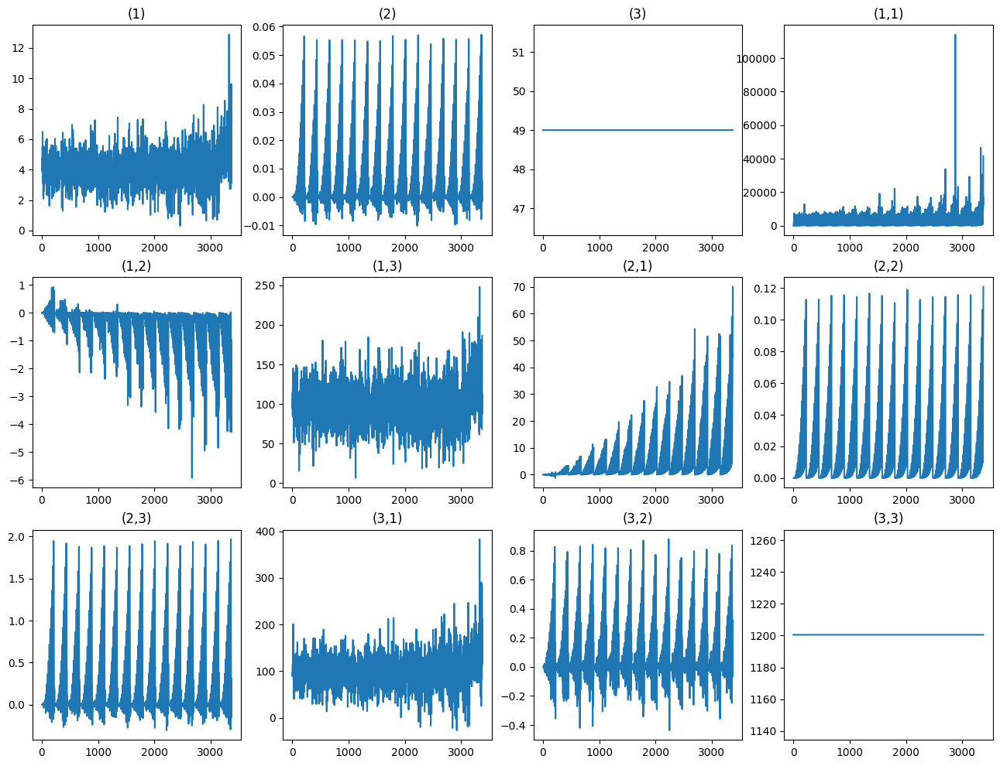

In [80]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4))
axs = axs.ravel()
for i, ax in enumerate(axs):
    ax.title.set_text(sig_keys.split()[i+1])
    ax.plot(Exp_signatures_results_rhos_and_sigmas_thetas.T[i])

In [82]:
def signatures_calculations_3_parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths):
    count=0
    for rho in by_parameter_3["by_rhos"]:
              for theta in by_parameter_3["by_thetas"]:
                  for sigma in by_parameter_3["by_sigmas"]:
                        # Caclulation of 10000 paths of prices and sigmas
                        prices_1, sigs_1 = generate_heston_paths(S, T, r, kappa, theta, theta, rho, sigma, steps, paths,
                                                                 return_vol=True)
                        for j in range(paths):
                            prices_and_sigs_with_time_tensor[j] = torch.tensor([prices_1[j], sigs_1[j], time_array]).T
                        #     shape of prices_and_sigs_witout_time_tensor=torch.Size([10000, 100, 3])

                        sign_ps_signatory_differentranges[count] = signatory.signature(prices_and_sigs_with_time_tensor, depth_of_sig)
                        #     shape of  sign_ps_signatory_differentranges=torch.Size([512, 10000, 12])

                        Exp_sign_signatory_results[count] = torch.mean(sign_ps_signatory_differentranges[count], axis=0)
                        #     shape of  Exp_sign_signatory_results=torch.Size([512, 12])

                        count = count + 1
    return sign_ps_signatory_differentranges,Exp_sign_signatory_results

In [83]:
results_rhos_and_thetas_sigmas=signatures_calculations_3_parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths)
signatures_results_rhos_and_thetas_sigmas=results_rhos_and_thetas_sigmas[0]
Exp_signatures_results_rhos_and_thetas_sigmas=results_rhos_and_thetas_sigmas[1]

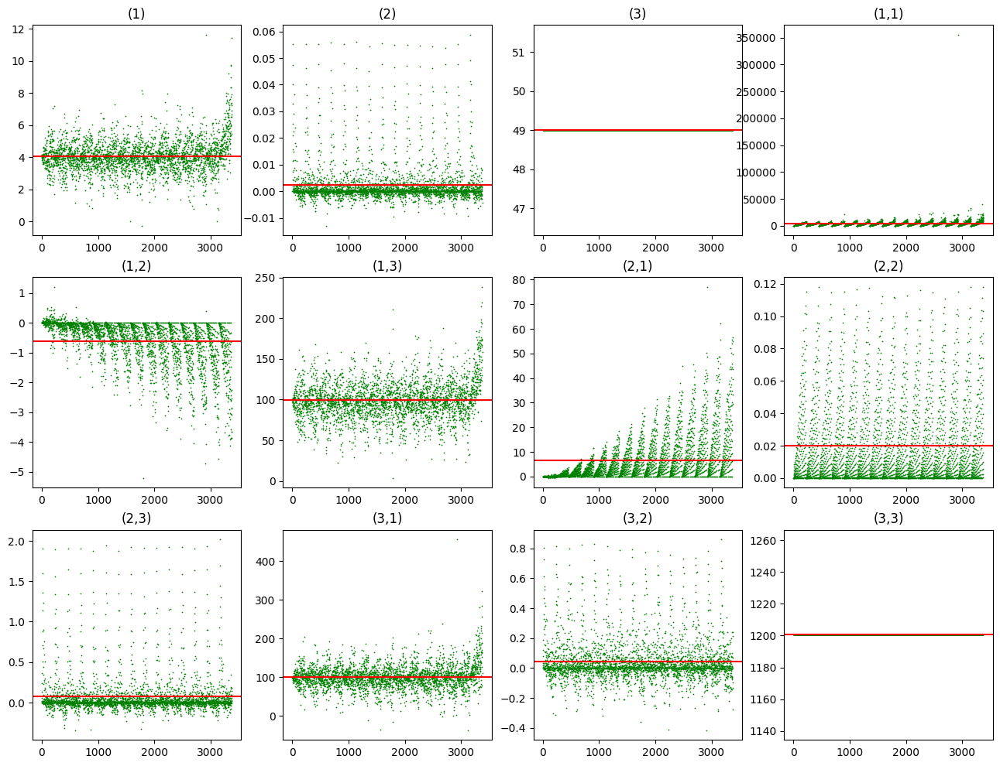

In [84]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4))
axs = axs.ravel()
for i, ax in enumerate(axs):
    ax.title.set_text(sig_keys.split()[i+1])
    ax.scatter(range(1,3376),Exp_signatures_results_rhos_and_thetas_sigmas.T[i], color='green', linewidth=0.15, s=1, alpha=1)
    ax.axhline(torch.mean(Exp_signatures_results_rhos_and_thetas_sigmas.T[i]), color='red')

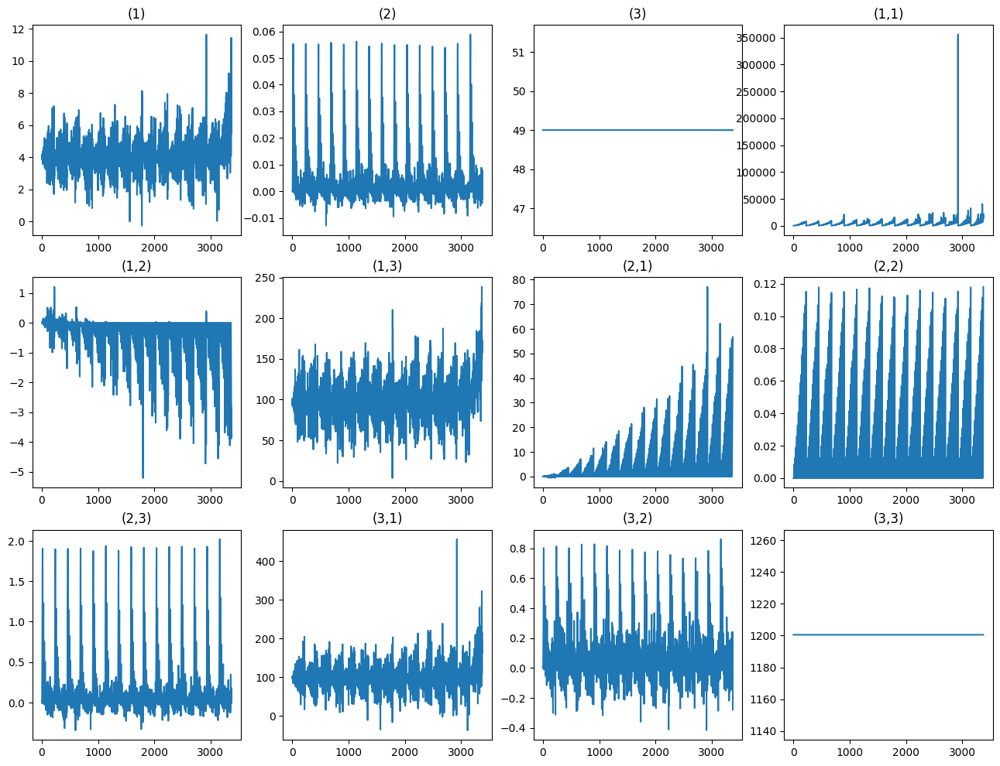

In [85]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4))
axs = axs.ravel()
for i, ax in enumerate(axs):
    ax.title.set_text(sig_keys.split()[i+1])
    ax.plot(Exp_signatures_results_rhos_and_thetas_sigmas.T[i])